<center>
<img src="../../img/ods_stickers.jpg" />
    
## [mlcourse.ai](https://mlcourse.ai) – دورة التعلم الآلي المفتوحة 
المؤلف: [ديمتري سيرجيف](https://github.com/DmitrySerg)، عالم البيانات @ Zeptolab، محاضر في مركز التمويل الرياضي بجامعة ولاية ميشيغان. ترجمة: @borowis. تخضع هذه المادة لشروط وأحكام ترخيص [Creative Commons CC BY-NC-SA 4.0](https://creativecommons.org/licenses/by-nc-sa/4.0/). الاستخدام المجاني مسموح به لأي غرض غير تجاري.



# <center>9. تحليل السلاسل الزمنية في Python</center>



مرحبًا!
نواصل دورة التعلم الآلي المفتوحة بمقال جديد عن السلاسل الزمنية.
دعونا نلقي نظرة على كيفية العمل مع السلاسل الزمنية في بايثون: ما هي الأساليب والنماذج التي يمكننا استخدامها للتنبؤ، ما هو التجانس الأسي المزدوج والثلاثي، ماذا تفعل إذا لم تكن الثبات هو الشيء المفضل لديك، وكيفية بناء SRIMA والبقاء على قيد الحياة، وكيفية إجراء التنبؤات باستخدام xgboost... بالإضافة إلى ذلك، سيتم تطبيق كل هذا على أمثلة العالم الحقيقي (القاسية).


# الخطوط العريضة للمادة:
1. [المقدمة](#المقدمة)
   - [مقاييس الجودة المتوقعة](#مقاييس الجودة المتوقعة)
2. [نقل، سلاسة، تقييم](#نقل،-سلس،-تقييم)
   - تقديرات النافذة المتداول
   - التجانس الأسي، نموذج هولت-وينترز
   - التحقق من صحة السلاسل الزمنية واختيار المعلمات
3. [منهج الاقتصاد القياسي](#نهج الاقتصاد القياسي)
   - الثبات، جذر الوحدة
   - التخلص من عدم الاستقرار
   - حدس ساريما وبناء النموذج
4. [النماذج الخطية (وليست تمامًا) للسلاسل الزمنية](#نماذج خطية (وغير تامة) للسلاسل الزمنية)
   - [استخراج الميزة](#استخراج الميزة)
   - [تأخر السلاسل الزمنية](#تأخر السلاسل الزمنية)
   - [ترميز الهدف](#ترميز الهدف)
   - [التنظيم واختيار الميزات](#Regularization-and-feature-selection)
   - [التعزيز](#التعزيز)
5. [الخاتمة](#الخاتمة)
6. [مهمة تجريبية](#مهمة تجريبية)
7. [مصادر مفيدة](#مصادر-مفيدة)



في عملي اليومي، أواجه مهام مرتبطة بالسلاسل الزمنية كل يوم تقريبًا. الأسئلة الأكثر شيوعًا هي التالية: ماذا سيحدث لمقاييسنا في اليوم/الأسبوع/الشهر التالي/وما إلى ذلك، كم عدد المستخدمين الذين سيقومون بتثبيت تطبيقنا، وكم من الوقت سيقضونه عبر الإنترنت، وكم عدد الإجراءات التي سيكملها المستخدمون، وما إلى ذلك. يمكننا التعامل مع مهام التنبؤ هذه باستخدام طرق مختلفة اعتمادًا على الجودة المطلوبة للتنبؤ، وطول فترة التنبؤ، وبالطبع الوقت الذي يتعين علينا فيه اختيار الميزات وضبط المعلمات لتحقيق النتائج المرجوة.



# مقدمة
نبدأ بـ [تعريف](https://en.wikipedia.org/wiki/Time_series) بسيط للسلسلة الزمنية:
> *السلسلة الزمنية* هي سلسلة من نقاط البيانات المفهرسة (أو المدرجة أو المخططة) بترتيب زمني.ولذلك، يتم تنظيم البيانات حسب طوابع زمنية حتمية نسبيًا، وقد تحتوي، مقارنةً ببيانات العينات العشوائية، على معلومات إضافية يمكننا استخلاصها.



دعونا استيراد بعض المكتبات. أولاً، سنحتاج إلى مكتبة [statsmodels](http://statsmodels.sourceforge.net/stable/)، التي تحتوي على العديد من وظائف النمذجة الإحصائية، بما في ذلك السلاسل الزمنية. بالنسبة لعشاق لغة R الذين اضطروا إلى الانتقال إلى Python، فإن `statsmodels` سيبدو بالتأكيد مألوفًا أكثر لأنه يدعم تعريفات النماذج مثل "Wage ~ Age + Education".


In [1]:
import matplotlib.pyplot as plt  # plots
import numpy as np  # vectors and matrices
import pandas as pd  # tables and data manipulations
import seaborn as sns  # more plots

sns.set()

import warnings  
from itertools import product  # some useful functions

import scipy.stats as scs
import statsmodels.api as sm
import statsmodels.formula.api as smf  # statistics and econometrics
import statsmodels.tsa.api as smt
from dateutil.relativedelta import \
    relativedelta  # working with dates with style
from scipy.optimize import minimize  # for function minimization
from tqdm.notebook import tqdm

warnings.filterwarnings("ignore") # `do not disturbe` mode

%matplotlib inline
%config InlineBackend.figure_format = 'retina'


على سبيل المثال، دعونا نلقي نظرة على بيانات الألعاب المحمولة الحقيقية. على وجه التحديد، سننظر في الإعلانات التي تتم مشاهدتها لكل ساعة والإنفاق بالعملة داخل اللعبة يوميًا:


In [2]:
ads = pd.read_csv("../../data/ads.csv", index_col=["Time"], parse_dates=["Time"])
currency = pd.read_csv(
    "../../data/currency.csv", index_col=["Time"], parse_dates=["Time"]
)

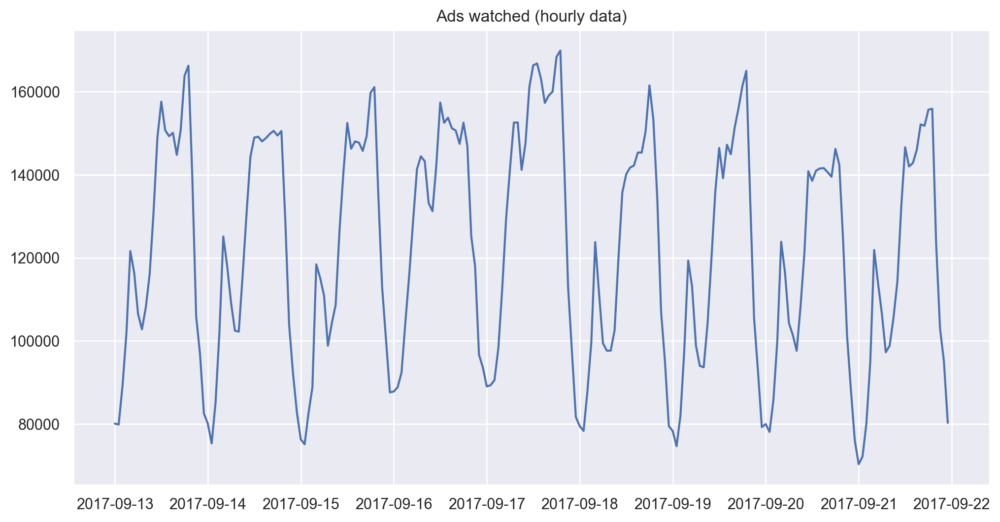

In [3]:
plt.figure(figsize=(12, 6))
plt.plot(ads.Ads)
plt.title("Ads watched (hourly data)")
plt.grid(True)
plt.show()

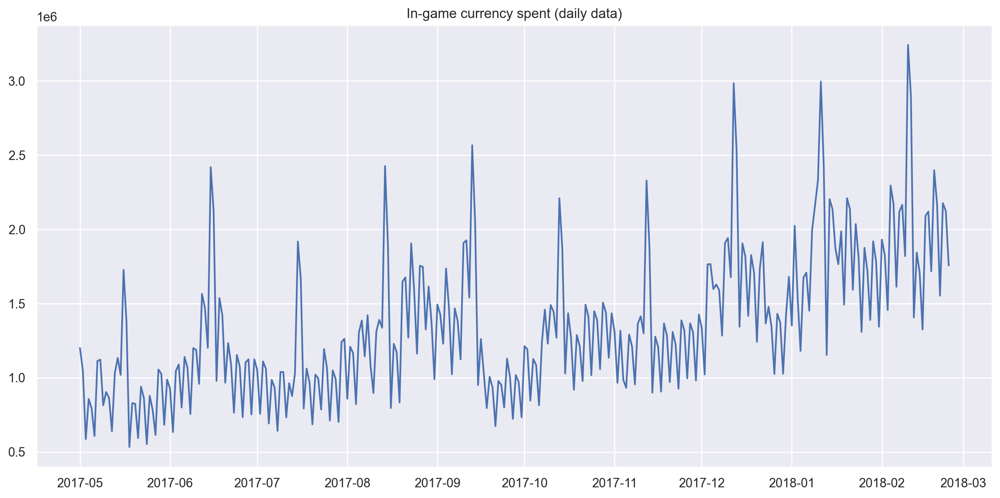

In [4]:
plt.figure(figsize=(15, 7))
plt.plot(currency.GEMS_GEMS_SPENT)
plt.title("In-game currency spent (daily data)")
plt.grid(True)
plt.show()


## توقعات مقاييس الجودة
قبل أن نبدأ بالتنبؤ، دعونا نفهم كيفية قياس جودة تنبؤاتنا وإلقاء نظرة على المقاييس الأكثر استخدامًا.



- [R تربيع](http://scikit-learn.org/stable/modules/model_evaluation.html#r2-score-the-coefficient-of-determination): معامل التحديد (في الاقتصاد القياسي، يمكن تفسير ذلك على أنه نسبة التباين التي يوضحها النموذج)، $(-\infty, 1]$
$R^2 = 1 - \frac{SS_{res}}{SS_{tot}}$ 
```python
sklearn.metrics.r2_score
```
---
- [متوسط الخطأ المطلق](http://scikit-learn.org/stable/modules/model_evaluation.html#mean-absolute-error): هذا مقياس قابل للتفسير لأنه يحتوي على نفس وحدة القياس مثل السلسلة الأولية، $[0, +\infty)$
$MAE = \frac{\sum\limits_{i=1}^{n} |y_i - \hat{y}_i|}{n}$ 
```python
sklearn.metrics.mean_absolute_error
```
---
- [الخطأ المطلق المتوسط](http://scikit-learn.org/stable/modules/model_evaluation.html#median-absolute-error): مرة أخرى، مقياس قابل للتفسير مثير للاهتمام بشكل خاص لأنه قوي بالنسبة للقيم المتطرفة، $[0, +\infty)$
$MedAE = median(|y_1 - \hat{y}_1|, ... , |y_n - \hat{y}_n|)$
```python
sklearn.metrics.median_absolute_error
```
---
- [متوسط الخطأ التربيعي](http://scikit-learn.org/stable/modules/model_evaluation.html#mean-squared-error): المقياس الأكثر استخدامًا والذي يعطي عقوبة أعلى للأخطاء الكبيرة والعكس صحيح، $[0, +\infty)$
$MSE = \frac{1}{n}\sum\limits_{i=1}^{n} (y_i - \hat{y}_i)^2$```python
sklearn.metrics.mean_squared_error
```
---
- [متوسط الخطأ اللوغاريتمي التربيعي](http://scikit-learn.org/stable/modules/model_evaluation.html#mean-squared-logarithmic-error): عمليا، هذا هو نفس MSE، لكننا نأخذ لوغاريتم السلسلة. ونتيجة لذلك، فإننا نعطي وزنًا أكبر للأخطاء الصغيرة أيضًا. يُستخدم هذا عادةً عندما تكون البيانات ذات اتجاهات أسية، $[0, +\infty)$
$MSLE = \frac{1}{n}\sum\limits_{i=1}^{n} (log(1+y_i) - log(1+\hat{y}_i))^2$
```python
sklearn.metrics.mean_squared_log_error
```
---
- متوسط النسبة المئوية للخطأ المطلق: هذا هو نفس MAE ولكن يتم حسابه كنسبة مئوية، وهو أمر مناسب جدًا عندما تريد شرح جودة النموذج للإدارة، $[0, +\infty)$
$MAPE = \frac{100}{n}\sum\limits_{i=1}^{n} \frac{|y_i - \hat{y}_i|}{y_i}$ 
```python
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
```


In [5]:
# Importing everything from above

from sklearn.metrics import (mean_absolute_error, mean_squared_error,
                             mean_squared_log_error, median_absolute_error,
                             r2_score)


def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


الآن بعد أن عرفنا كيفية قياس جودة التوقعات، دعونا نرى ما هي المقاييس التي يمكننا استخدامها وكيفية ترجمة النتائج للرئيس. بعد ذلك، تبقى تفاصيل صغيرة واحدة - بناء النموذج.



# تحرك، وسلس، وقم بالتقييم



لنبدأ بفرضية ساذجة: "غدًا سيكون مثل اليوم". ومع ذلك، بدلاً من نموذج مثل $\hat{y}_{t} = y_{t-1}$ (والذي يعد في الواقع خط أساس رائع لأي مشاكل تنبؤ بالسلاسل الزمنية وفي بعض الأحيان يكون من المستحيل التغلب عليه)، سنفترض أن القيمة المستقبلية للمتغير الخاص بنا تعتمد على متوسط ​​قيم $k$ السابقة. ولذلك، سوف نستخدم **المتوسط ​​المتحرك**.
$\hat{y}_{t} = \frac{1}{k} \displaystyle\sum^{k}_{n=1} y_{t-n}$


In [6]:
def moving_average(series, n):
    """
        Calculate average of last n observations
    """
    return np.average(series[-n:])


moving_average(ads, 24)  # prediction for the last observed day (past 24 hours)

np.float64(116805.0)


لسوء الحظ، لا يمكننا إجراء تنبؤات في المستقبل البعيد - من أجل الحصول على قيمة الخطوة التالية، نحتاج إلى ملاحظة القيم السابقة فعليًا. لكن المتوسط ​​المتحرك له حالة استخدام أخرى - وهي تسهيل السلسلة الزمنية الأصلية لتحديد الاتجاهات. لدى Pandas تطبيق متاح مع [`DataFrame.rolling(window).mean()`](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.rolling.html). كلما كانت النافذة أوسع، كان الاتجاه أكثر سلاسة. في حالة البيانات الصاخبة للغاية، والتي غالبًا ما تتم مواجهتها في مجال التمويل، يمكن أن يساعد هذا الإجراء في اكتشاف الأنماط الشائعة.


In [7]:
def plotMovingAverage(
    series, window, plot_intervals=False, scale=1.96, plot_anomalies=False
):

    """
        series - dataframe with timeseries
        window - rolling window size 
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 

    """
    rolling_mean = series.rolling(window=window).mean()

    plt.figure(figsize=(15, 5))
    plt.title("Moving average\n window size = {}".format(window))
    plt.plot(rolling_mean, "g", label="Rolling mean trend")

    # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")

        # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index, columns=series.columns)
            anomalies[series < lower_bond] = series[series < lower_bond]
            anomalies[series > upper_bond] = series[series > upper_bond]
            plt.plot(anomalies, "ro", markersize=10)

    plt.plot(series[window:], label="Actual values")
    plt.legend(loc="upper left")
    plt.grid(True)


دعونا ننعم بالساعات الأربع الماضية.

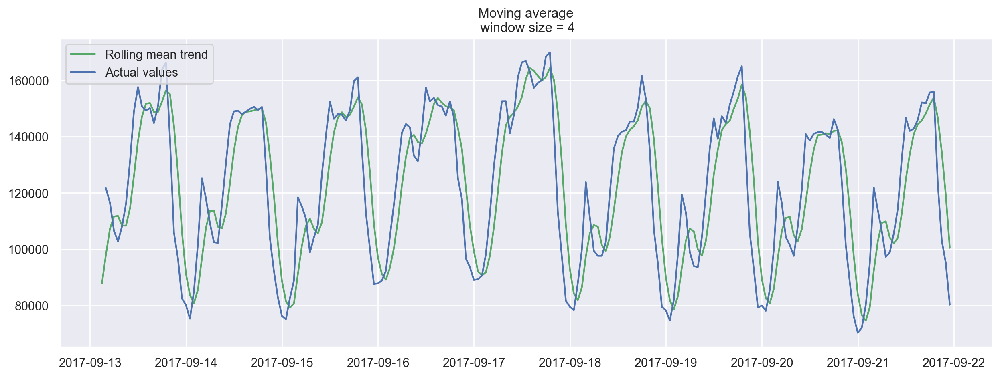

In [8]:
plotMovingAverage(ads, 4)


الآن دعونا نحاول التجانس خلال الـ 12 ساعة الماضية.


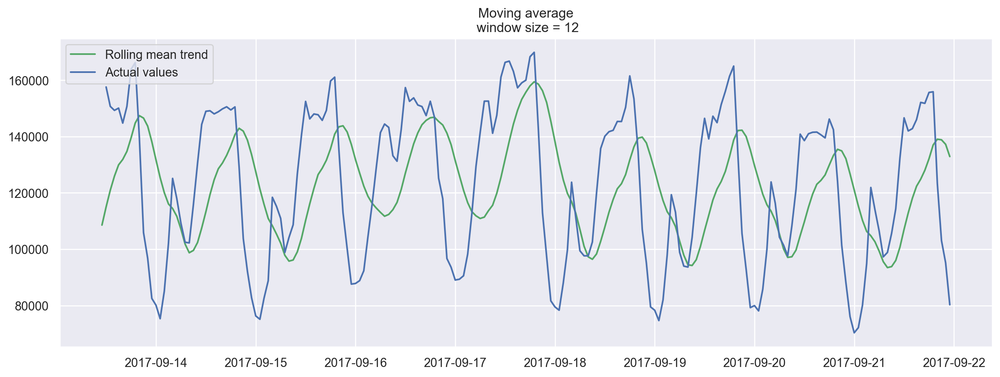

In [9]:
plotMovingAverage(ads, 12)


الآن، مع التجانس مع الـ 24 ساعة السابقة، نحصل على الاتجاه اليومي.


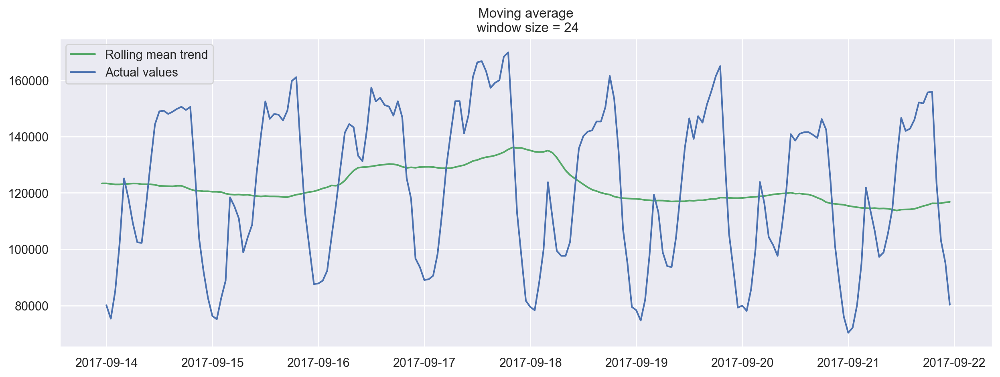

In [10]:
plotMovingAverage(ads, 24)


عندما طبقنا التحسين اليومي على البيانات بالساعة، تمكنا من رؤية ديناميكيات الإعلانات التي تمت مشاهدتها بوضوح. خلال عطلات نهاية الأسبوع، تكون القيم أعلى (مزيد من الوقت للعب في عطلات نهاية الأسبوع) بينما تتم مشاهدة عدد أقل من الإعلانات في أيام الأسبوع.



يمكننا أيضًا رسم فترات الثقة لقيمنا المبسطة.


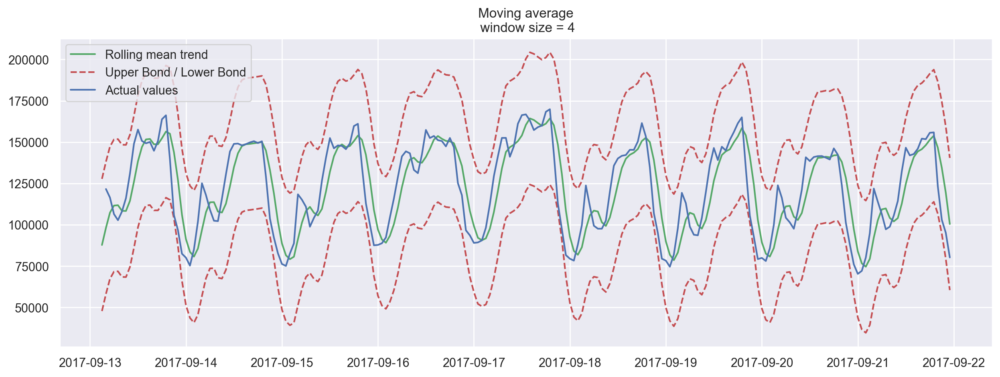

In [11]:
plotMovingAverage(ads, 4, plot_intervals=True)


الآن، دعونا ننشئ نظامًا بسيطًا للكشف عن الشذوذ بمساعدة المتوسط المتحرك. لسوء الحظ، في مجموعة البيانات هذه، كل شيء طبيعي إلى حد ما، لذلك سنتعمد جعل إحدى القيم غير طبيعية في إطار البيانات الخاص بنا `ads_anomaly`.


In [12]:
ads_anomaly = ads.copy()
ads_anomaly.iloc[-20] = ads_anomaly.iloc[-20] * 0.2  # say we have 80% drop of ads


دعونا نرى ما إذا كانت هذه الطريقة البسيطة يمكنها اكتشاف الشذوذ.


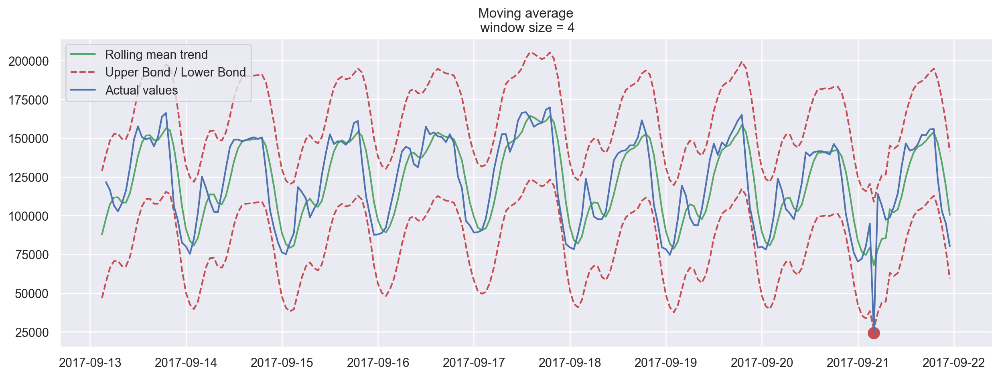

In [13]:
plotMovingAverage(ads_anomaly, 4, plot_intervals=True, plot_anomalies=True)


أنيق! وماذا عن السلسلة الثانية؟


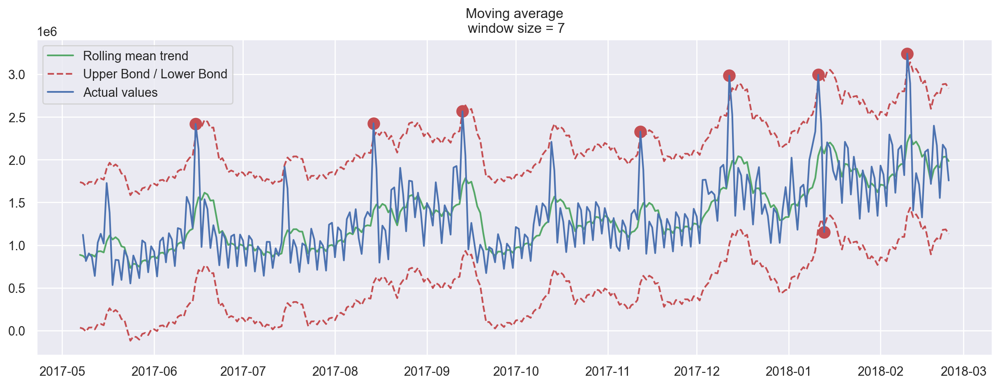

In [14]:
plotMovingAverage(
    currency, 7, plot_intervals=True, plot_anomalies=True
)  # weekly smoothing


أوه لا، لم يكن هذا رائعًا! هنا، يمكننا أن نرى الجانب السلبي لنهجنا البسيط - فهو لم يلتقط الموسمية الشهرية في بياناتنا ووصف جميع قمم الثلاثين يومًا تقريبًا بأنها حالات شاذة. إذا كنت تريد تجنب النتائج الإيجابية الكاذبة، فمن الأفضل أن تفكر في نماذج أكثر تعقيدًا. 



**المتوسط المرجح** هو تعديل بسيط للمتوسط المتحرك. مجموع الأوزان يصل إلى `1` مع أوزان أكبر مخصصة للملاحظات الأحدث.
$\hat{y}_{t} = \displaystyle\sum^{k}_{n=1} \omega_n y_{t+1-n}$


In [15]:
def weighted_average(series, weights):
    """
        Calculate weighted average on the series.
        Assuming weights are sorted in descending order
        (larger weights are assigned to more recent observations).
    """
    result = 0.0
    for n in range(len(weights)):
        result += series.iloc[-n - 1] * weights[n]
    return float(result)

In [16]:
weighted_average(ads, [0.6, 0.3, 0.1])

87025.5

In [17]:
# just checking
0.6 * ads.iloc[-1] + 0.3 * ads.iloc[-2] + 0.1 * ads.iloc[-3]

Ads    87025.5
dtype: float64


## التجانس الأسي



الآن، دعونا نرى ما سيحدث إذا، بدلاً من ترجيح قيم $k$ الأخيرة للسلسلة الزمنية، بدأنا في ترجيح جميع الملاحظات المتاحة مع تقليل الأوزان بشكل كبير مع رجوعنا إلى الوراء في الوقت المناسب. توجد صيغة **[التجانس الأسي](https://en.wikipedia.org/wiki/Exponential_smoothing)** ستساعدنا في هذا:
$$\hat{y}_{t} = \alpha \cdot y_t + (1-\alpha) \cdot \hat y_{t-1} $$قيمة النموذج هنا هي متوسط ​​مرجح بين القيمة الحقيقية الحالية وقيم النموذج السابق. يُطلق على الوزن $\alpha$ اسم عامل التنعيم. إنه يحدد مدى سرعة "نسيان" آخر ملاحظة حقيقية متاحة. كلما كان $\alpha$ أصغر، زاد تأثير الملاحظات السابقة وكانت السلسلة أكثر سلاسة.
يتم إخفاء الأسية في تكرارية الدالة - فنحن نضرب بـ $(1-\alpha)$ في كل مرة، والذي يحتوي بالفعل على ضرب بـ $(1-\alpha)$ لقيم النموذج السابقة.


In [18]:
def exponential_smoothing(series, alpha):
    """
        series - dataset with timestamps
        alpha - float [0.0, 1.0], smoothing parameter
    """
    result = [series[0]]  # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n - 1])
    return result

In [27]:
def plotExponentialSmoothing(series, alphas):
    """
        Plots exponential smoothing with different alphas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters
        
    """
    plt.figure(figsize=(15, 7))
    for alpha in alphas:
        plt.plot(
            exponential_smoothing(series, alpha), label="Alpha {}".format(alpha)
        )
    plt.plot(series.values, "c", label="Actual")
    plt.legend(loc="best")
    plt.axis("tight")
    plt.title("Exponential Smoothing")
    plt.grid(True);

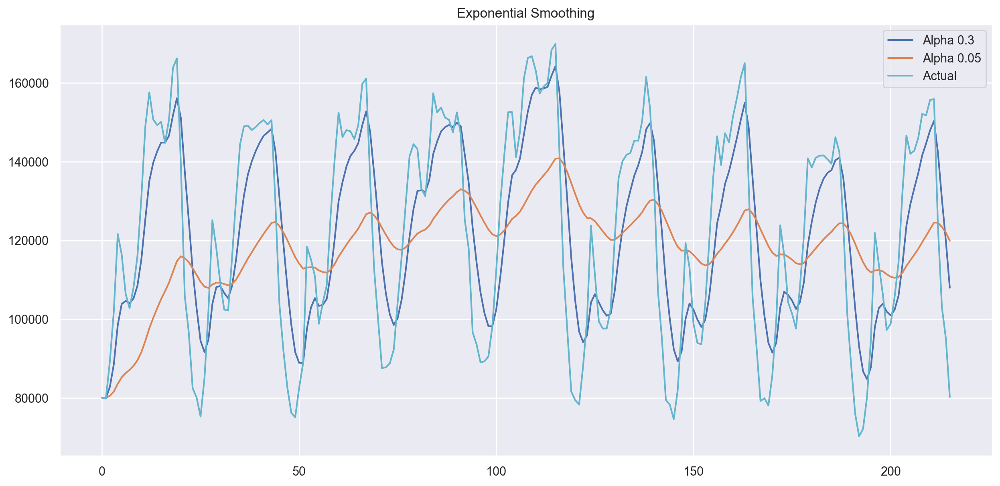

In [28]:
plotExponentialSmoothing(ads.Ads, [0.3, 0.05])

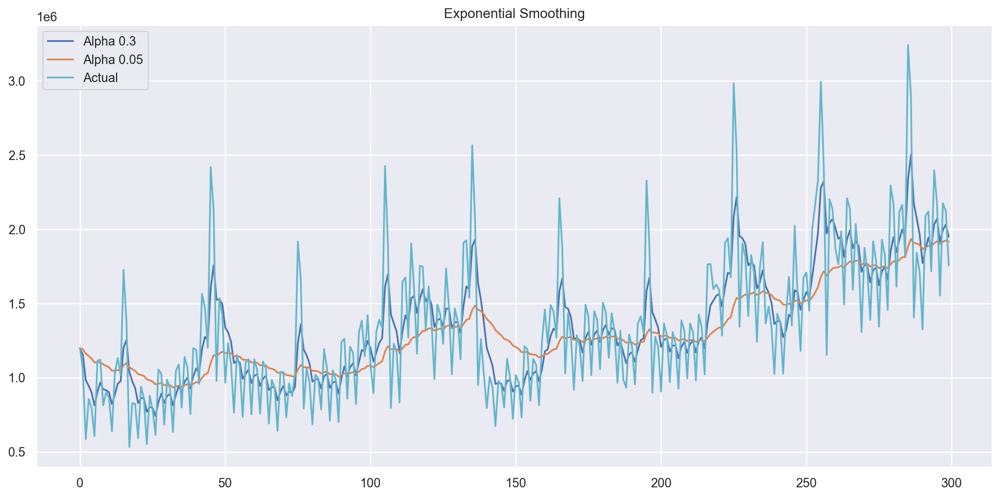

In [29]:
plotExponentialSmoothing(currency.GEMS_GEMS_SPENT, [0.3, 0.05])


## التجانس الأسي المزدوج



حتى الآن، كانت الطرق التي ناقشناها مخصصة للتنبؤ بنقطة مستقبلية واحدة (مع بعض التجانس اللطيف). وهذا أمر رائع، ولكنه ليس كافياً أيضاً. دعونا نوسع التجانس الأسي حتى نتمكن من التنبؤ بنقطتين مستقبليتين (بالطبع، سنقوم أيضًا بتضمين المزيد من التجانس).
سوف يساعدنا تحليل السلسلة - نحصل على مكونين: التقاطع (أي المستوى) $\ell$ والمنحدر (أي الاتجاه) $b$. لقد تعلمنا التنبؤ بالتقاطع (أو قيمة السلسلة المتوقعة) باستخدام طرقنا السابقة؛ الآن، سوف نطبق نفس التجانس الأسي على الاتجاه من خلال افتراض أن الاتجاه المستقبلي لتغيرات السلاسل الزمنية يعتمد على التغييرات المرجحة السابقة. ونتيجة لذلك، نحصل على مجموعة الوظائف التالية:
$$\ell_x = \alpha y_x + (1-\alpha)(\ell_{x-1} + b_{x-1})$$
$$b_x = \beta(\ell_x - \ell_{x-1}) + (1-\beta)b_{x-1}$$
$$\hat{y}_{x+1} = \ell_x + b_x$$يصف الأول التقاطع، والذي، كما كان من قبل، يعتمد على القيمة الحالية للسلسلة. يتم الآن تقسيم المصطلح الثاني إلى القيم السابقة للمستوى والاتجاه. تصف الوظيفة الثانية الاتجاه، والذي يعتمد على تغيرات المستوى في الخطوة الحالية وعلى القيمة السابقة للاتجاه. في هذه الحالة، يعد المعامل $\beta$ بمثابة وزن للتجانس الأسي. التنبؤ النهائي هو مجموع قيم نموذج التقاطع والاتجاه.


In [31]:
def double_exponential_smoothing(series, alpha, beta):
    """
        series - dataset with timeseries
        alpha - float [0.0, 1.0], smoothing parameter for level
        beta - float [0.0, 1.0], smoothing parameter for trend
    """
    # first value is same as series
    result = [series[0]]
    for n in range(1, len(series) + 1):
        if n == 1:
            level, trend = series[0], series[1] - series[0]
        if n >= len(series):  # forecasting
            value = result[-1]
        else:
            value = series[n]
        last_level, level = level, alpha * value + (1 - alpha) * (level + trend)
        trend = beta * (level - last_level) + (1 - beta) * trend
        result.append(level + trend)
    return result


def plotDoubleExponentialSmoothing(series, alphas, betas):
    """
        Plots double exponential smoothing with different alphas and betas
        
        series - dataset with timestamps
        alphas - list of floats, smoothing parameters for level
        betas - list of floats, smoothing parameters for trend
    """

    plt.figure(figsize=(20, 8))
    for alpha in alphas:
        for beta in betas:
            plt.plot(
                double_exponential_smoothing(series, alpha, beta),
                label="Alpha {}, beta {}".format(alpha, beta),
            )
    plt.plot(series.values, label="Actual")
    plt.legend(loc="best")
    plt.axis("tight")
    plt.title("Double Exponential Smoothing")
    plt.grid(True)

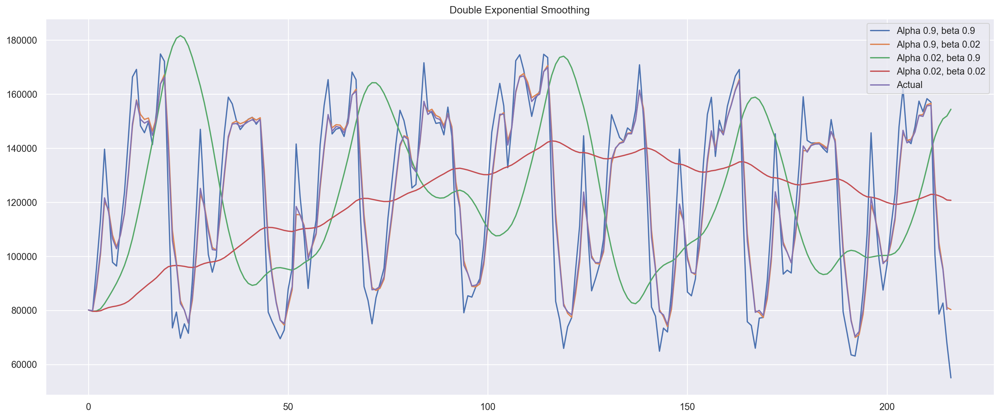

In [32]:
plotDoubleExponentialSmoothing(ads.Ads, alphas=[0.9, 0.02], betas=[0.9, 0.02])

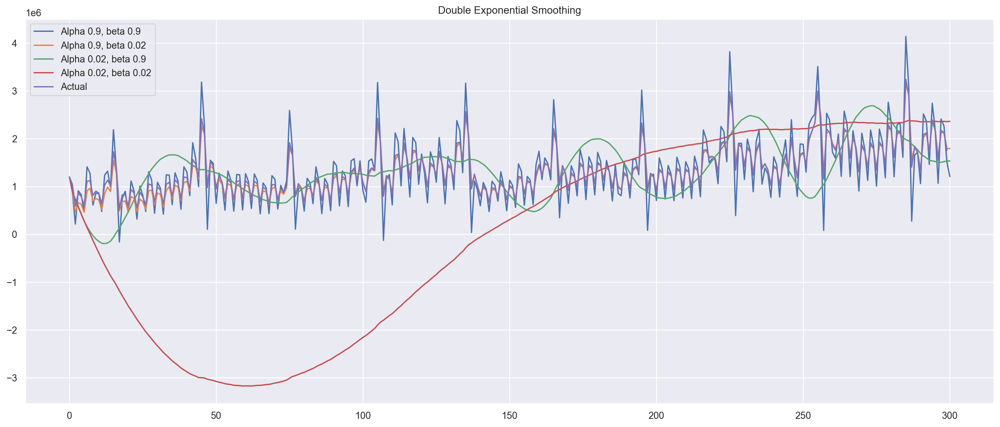

In [33]:
plotDoubleExponentialSmoothing(
    currency.GEMS_GEMS_SPENT, alphas=[0.9, 0.02], betas=[0.9, 0.02]
)


يتعين علينا الآن ضبط معلمتين: $\alpha$ و$\beta$. الأول مسؤول عن تجانس السلسلة حول الاتجاه، والأخير هو المسؤول عن تجانس الاتجاه نفسه. كلما كانت القيم أكبر، زاد وزن الملاحظات الأحدث وأقل سلاسة في سلسلة النماذج. قد تؤدي مجموعات معينة من المعلمات إلى نتائج غريبة، خاصة إذا تم ضبطها يدويًا. سننظر في اختيار المعلمات تلقائيًا بعد قليل؛ قبل ذلك، دعونا نناقش التجانس الأسي الثلاثي.



## التجانس الأسي الثلاثي المعروف أيضًا باسم هولت وينترز
لقد نظرنا إلى التجانس الأسي والتجانس الأسي المزدوج. هذه المرة، نحن ندخل في التجانس الأسي _الثلاثي_.كما كنت قد خمنت، فإن الفكرة هي إضافة عنصر ثالث - الموسمية. وهذا يعني أنه لا ينبغي لنا استخدام هذه الطريقة إذا لم يكن من المتوقع أن تكون سلاسلنا الزمنية موسمية. سوف تشرح المكونات الموسمية في النموذج الاختلافات المتكررة حول التقاطع والاتجاه، وسيتم تحديدها بطول الموسم، وبعبارة أخرى بالفترة التي تتكرر بعدها الاختلافات. لكل ملاحظة في الموسم، هناك عنصر منفصل؛ على سبيل المثال، إذا كان طول الموسم 7 أيام (موسمية أسبوعية)، فسيكون لدينا 7 مكونات موسمية، مكون واحد لكل يوم من أيام الأسبوع.
وبهذا، دعونا نكتب نظامًا جديدًا من المعادلات:
$$\ell_x = \alpha(y_x - s_{x-L}) + (1-\alpha)(\ell_{x-1} + b_{x-1})$$
$$b_x = \beta(\ell_x - \ell_{x-1}) + (1-\beta)b_{x-1}$$
$$s_x = \gamma(y_x - \ell_x) + (1-\gamma)s_{x-L}$$
$$\hat{y}_{x+m} = \ell_x + mb_x + s_{x-L+1+(m-1)modL}$$
يعتمد التقاطع الآن على القيمة الحالية للسلسلة مطروحًا منها أي مكون موسمي مناظر. يبقى الاتجاه دون تغيير، ويعتمد المكون الموسمي على القيمة الحالية للسلسلة مطروحًا منها التقاطع وعلى القيمة السابقة للمكون. مع الأخذ في الاعتبار أن المكون يتم تنعيمه خلال جميع المواسم المتاحة؛ على سبيل المثال، إذا كان لدينا مكون يوم الاثنين، فسيتم حساب متوسطه فقط مع أيام الاثنين الأخرى. يمكنك قراءة المزيد حول كيفية عمل المتوسط ​​وكيفية إجراء التقريب الأولي للاتجاه والمكونات الموسمية [هنا](http://www.itl.nist.gov/div898/handbook/pmc/section4/pmc435.htm). الآن بعد أن أصبح لدينا المكون الموسمي، يمكننا التنبؤ ليس فقط بخطوة أو خطوتين للأمام، بل بخطوات مستقبلية عشوائية $m$، وهو أمر مشجع للغاية.
يوجد أدناه رمز لنموذج التجانس الأسي الثلاثي، والذي يُعرف أيضًا بالأسماء الأخيرة لمنشئيه، تشارلز هولت وتلميذه بيتر وينترز. بالإضافة إلى ذلك، تم تضمين طريقة بروتلاج في النموذج لإنتاج فترات الثقة:
$$\hat y_{max_x}=\ell_{x−1}+b_{x−1}+s_{x−T}+m⋅d_{t−T}$$
$$\hat y_{min_x}=\ell_{x−1}+b_{x−1}+s_{x−T}-m⋅d_{t−T}$$
$$d_t=\gamma∣y_t−\hat y_t∣+(1−\gamma)d_{t−T},$$حيث $T$ هو طول الموسم، و$d$ هو الانحراف المتوقع. تم أخذ معلمات أخرى من التجانس الأسي الثلاثي. يمكنك قراءة المزيد حول الطريقة وإمكانية تطبيقها على اكتشاف الحالات الشاذة في السلاسل الزمنية [هنا](http://fedcsis.org/proceedings/2012/pliks/118.pdf).


In [34]:
class HoltWinters:

    """
    Holt-Winters model with the anomalies detection using Brutlag method
    
    # series - initial time series
    # slen - length of a season
    # alpha, beta, gamma - Holt-Winters model coefficients
    # n_preds - predictions horizon
    # scaling_factor - sets the width of the confidence interval by Brutlag (usually takes values from 2 to 3)
    
    """

    def __init__(self, series, slen, alpha, beta, gamma, n_preds, scaling_factor=1.96):
        self.series = series
        self.slen = slen
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.n_preds = n_preds
        self.scaling_factor = scaling_factor

    def initial_trend(self):
        sum = 0.0
        for i in range(self.slen):
            sum += float(self.series[i + self.slen] - self.series[i]) / self.slen
        return sum / self.slen

    def initial_seasonal_components(self):
        seasonals = {}
        season_averages = []
        n_seasons = int(len(self.series) / self.slen)
        # let's calculate season averages
        for j in range(n_seasons):
            season_averages.append(
                sum(self.series[self.slen * j : self.slen * j + self.slen])
                / float(self.slen)
            )
        # let's calculate initial values
        for i in range(self.slen):
            sum_of_vals_over_avg = 0.0
            for j in range(n_seasons):
                sum_of_vals_over_avg += (
                    self.series[self.slen * j + i] - season_averages[j]
                )
            seasonals[i] = sum_of_vals_over_avg / n_seasons
        return seasonals

    def triple_exponential_smoothing(self):
        self.result = []
        self.Smooth = []
        self.Season = []
        self.Trend = []
        self.PredictedDeviation = []
        self.UpperBond = []
        self.LowerBond = []

        seasonals = self.initial_seasonal_components()

        for i in range(len(self.series) + self.n_preds):
            if i == 0:  # components initialization
                smooth = self.series[0]
                trend = self.initial_trend()
                self.result.append(self.series[0])
                self.Smooth.append(smooth)
                self.Trend.append(trend)
                self.Season.append(seasonals[i % self.slen])

                self.PredictedDeviation.append(0)

                self.UpperBond.append(
                    self.result[0] + self.scaling_factor * self.PredictedDeviation[0]
                )

                self.LowerBond.append(
                    self.result[0] - self.scaling_factor * self.PredictedDeviation[0]
                )
                continue

            if i >= len(self.series):  # predicting
                m = i - len(self.series) + 1
                self.result.append((smooth + m * trend) + seasonals[i % self.slen])

                # when predicting we increase uncertainty on each step
                self.PredictedDeviation.append(self.PredictedDeviation[-1] * 1.01)

            else:
                val = self.series[i]
                last_smooth, smooth = (
                    smooth,
                    self.alpha * (val - seasonals[i % self.slen])
                    + (1 - self.alpha) * (smooth + trend),
                )
                trend = self.beta * (smooth - last_smooth) + (1 - self.beta) * trend
                seasonals[i % self.slen] = (
                    self.gamma * (val - smooth)
                    + (1 - self.gamma) * seasonals[i % self.slen]
                )
                self.result.append(smooth + trend + seasonals[i % self.slen])

                # Deviation is calculated according to Brutlag algorithm.
                self.PredictedDeviation.append(
                    self.gamma * np.abs(self.series[i] - self.result[i])
                    + (1 - self.gamma) * self.PredictedDeviation[-1]
                )

            self.UpperBond.append(
                self.result[-1] + self.scaling_factor * self.PredictedDeviation[-1]
            )

            self.LowerBond.append(
                self.result[-1] - self.scaling_factor * self.PredictedDeviation[-1]
            )

            self.Smooth.append(smooth)
            self.Trend.append(trend)
            self.Season.append(seasonals[i % self.slen])


## التحقق من صحة السلاسل الزمنية
قبل أن نبدأ في بناء نموذج، دعونا أولاً نناقش كيفية تقدير معلمات النموذج تلقائيًا.
لا يوجد شيء غير عادي هنا؛ وكما هو الحال دائمًا، يتعين علينا اختيار دالة خسارة مناسبة للمهمة التي ستخبرنا بمدى قرب النموذج من البيانات. بعد ذلك، باستخدام التحقق المتبادل، سنقوم بتقييم دالة الخسارة التي اخترناها لمعلمات النموذج المحددة، وحساب التدرج، وضبط معلمات النموذج، وما إلى ذلك، وننزل في النهاية إلى الحد الأدنى العالمي.
قد تتساءل عن كيفية إجراء التحقق المتبادل من السلاسل الزمنية لأن السلاسل الزمنية لها هذا الهيكل الزمني ولا يمكن للمرء خلط القيم بشكل عشوائي في حظيرة مع الحفاظ على هذا الهيكل. مع التوزيع العشوائي، سيتم فقدان كل التبعيات الزمنية بين الملاحظات. ولهذا السبب سيتعين علينا استخدام نهج أكثر صعوبة في تحسين معلمات النموذج. لا أعرف ما إذا كان هناك اسم رسمي لهذا، ولكن في [CrossValidated](https://stats.stackexchange.com/questions/14099/using-k-fold-cross-validation-for-time-series-model-selection)، حيث يمكن للمرء العثور على جميع الإجابات باستثناء إجابة السؤال النهائي للحياة والكون وكل شيء، الاسم المقترح لهذه الطريقة هو "التحقق المتبادل على أساس متجدد".الفكرة بسيطة إلى حد ما - نحن ندرب نموذجنا على جزء صغير من السلسلة الزمنية من البداية حتى بعض $t$، ونقوم بالتنبؤ بالخطوات $t+n$ التالية، ونحسب الخطأ. بعد ذلك، نقوم بتوسيع نموذج التدريب الخاص بنا إلى قيمة $t+n$، ونقوم بالتنبؤات من $t+n$ حتى $t+2*n$، ونواصل تحريك شريحة الاختبار الخاصة بنا من السلسلة الزمنية حتى نصل إلى آخر ملاحظة متاحة. ونتيجة لذلك، لدينا العديد من الطيات التي تناسب $n$ بين عينة التدريب الأولية والملاحظة الأخيرة.
<img src="../../img/time_series_cv.png"/>



الآن، بعد أن عرفنا كيفية إعداد التحقق المتبادل، يمكننا العثور على المعلمات المثالية لنموذج Holt-Winters. تذكر أن لدينا موسمية يومية في الإعلانات، ومن هنا تأتي المعلمة `slen=24`.


In [35]:
from sklearn.model_selection import \
    TimeSeriesSplit  # you have everything done for you


def timeseriesCVscore(params, series, loss_function=mean_squared_error, slen=24):
    """
        Returns error on CV  
        
        params - vector of parameters for optimization
        series - dataset with timeseries
        slen - season length for Holt-Winters model
    """
    # errors array
    errors = []

    values = series.values
    alpha, beta, gamma = params

    # set the number of folds for cross-validation
    tscv = TimeSeriesSplit(n_splits=3)

    # iterating over folds, train model on each, forecast and calculate error
    for train, test in tscv.split(values):

        model = HoltWinters(
            series=values[train],
            slen=slen,
            alpha=alpha,
            beta=beta,
            gamma=gamma,
            n_preds=len(test),
        )
        model.triple_exponential_smoothing()

        predictions = model.result[-len(test) :]
        actual = values[test]
        error = loss_function(predictions, actual)
        errors.append(error)

    return np.mean(np.array(errors))


في نموذج Holt-Winters، وكذلك في النماذج الأخرى للتجانس الأسي، هناك قيد على مدى حجم معلمات التجانس، حيث تتراوح كل واحدة منها من 0 إلى 1. لذلك، من أجل تقليل دالة الخسارة لدينا، يتعين علينا اختيار خوارزمية تدعم القيود على معلمات النموذج. في حالتنا، سوف نستخدم التدرج المترافق لنيوتن.


In [38]:
data = ads.Ads[:-20]  # leave some data for testing

# initializing model parameters alpha, beta and gamma
x = [0, 0, 0]

# Minimizing the loss function
opt = minimize(
    timeseriesCVscore,
    x0=x,
    args=(data, mean_squared_log_error),
    method="TNC",
    bounds=((0, 1), (0, 1), (0, 1)),
)

# Take optimal values...
alpha_final, beta_final, gamma_final = opt.x
print(alpha_final, beta_final, gamma_final)

# ...and train the model with them, forecasting for the next 50 hours
model = HoltWinters(
    data,
    slen=24,
    alpha=alpha_final,
    beta=beta_final,
    gamma=gamma_final,
    n_preds=50,
    scaling_factor=3,
)
model.triple_exponential_smoothing()

0.11912291397687808 0.00269957583214403 0.05376597682877887



دعونا نضيف بعض التعليمات البرمجية لتقديم المؤامرات.


In [42]:
def plotHoltWinters(model, series, plot_intervals=False, plot_anomalies=False):
    """
        model – HoltWinters model
        series - dataset with timeseries
        plot_intervals - show confidence intervals
        plot_anomalies - show anomalies 
    """

    plt.figure(figsize=(20, 10))
    plt.plot(model.result, label="Model")
    plt.plot(series.values, label="Actual")
    error = mean_absolute_percentage_error(series.values, model.result[: len(series)])
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))

    if plot_anomalies:
        anomalies = np.array([np.nan] * len(series))
        anomalies[series.values < model.LowerBond[: len(series)]] = series.values[
            series.values < model.LowerBond[: len(series)]
        ]
        anomalies[series.values > model.UpperBond[: len(series)]] = series.values[
            series.values > model.UpperBond[: len(series)]
        ]
        plt.plot(anomalies, "o", markersize=10, label="Anomalies")

    if plot_intervals:
        plt.plot(model.UpperBond, "r--", alpha=0.5, label="Up/Low confidence")
        plt.plot(model.LowerBond, "r--", alpha=0.5)
        plt.fill_between(
            x=range(0, len(model.result)),
            y1=model.UpperBond,
            y2=model.LowerBond,
            alpha=0.2,
            color="grey",
        )

    plt.vlines(
        len(series),
        ymin=min(model.LowerBond),
        ymax=max(model.UpperBond),
        linestyles="dashed",
    )
    plt.axvspan(len(series) - 20, len(model.result), alpha=0.3, color="lightgrey")
    plt.grid(True)
    plt.axis("tight")
    plt.legend(loc="best", fontsize=13);

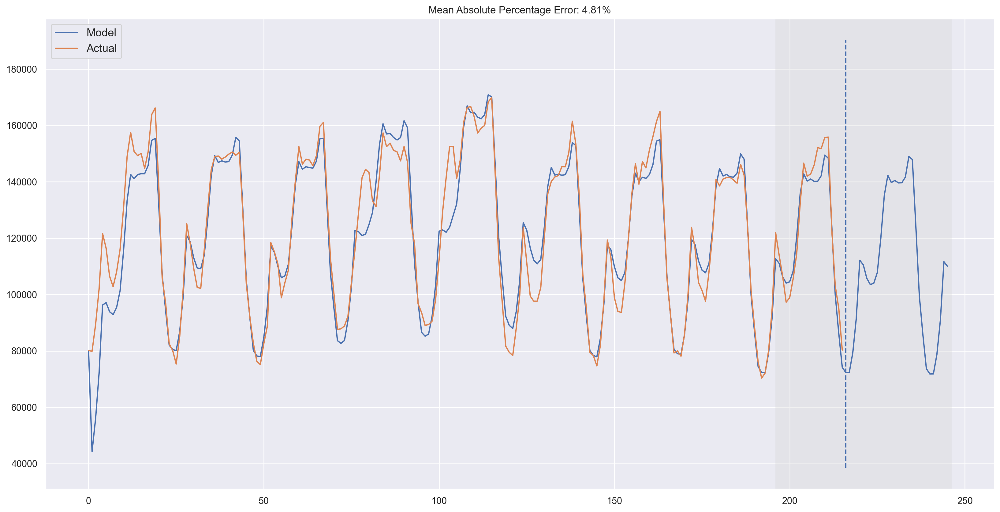

In [43]:
plotHoltWinters(model=model, series=ads.Ads)

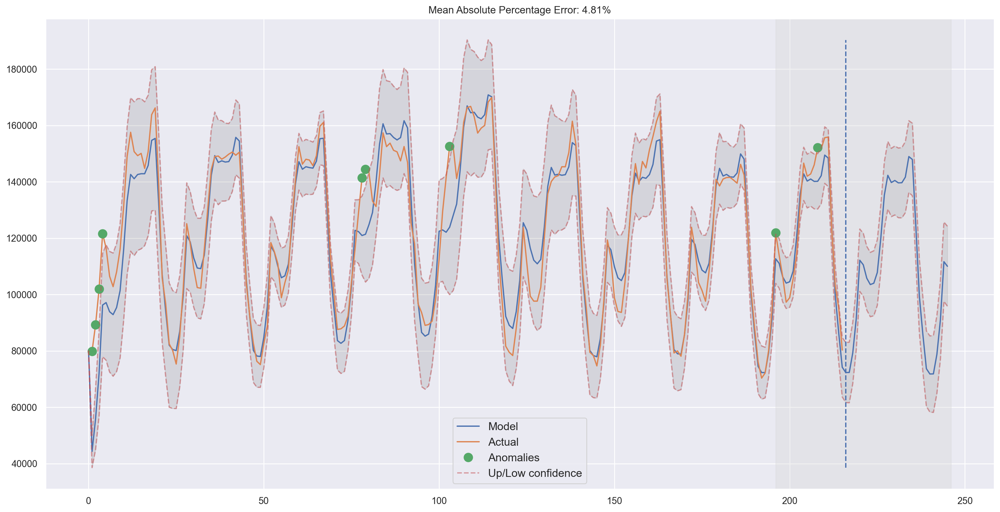

In [44]:
plotHoltWinters(model=model, series=ads.Ads, plot_intervals=True, plot_anomalies=True)

انطلاقا من المؤامرات، كان نموذجنا قادرا على تقريب السلسلة الزمنية الأولية بنجاح، والتقاط الموسمية اليومية، والاتجاه الهبوطي العام، وحتى بعض الحالات الشاذة. إذا نظرت إلى انحرافات النموذج، يمكنك أن ترى بوضوح أن النموذج يتفاعل بشكل حاد مع التغييرات في بنية السلسلة ولكنه بعد ذلك يعيد الانحراف بسرعة إلى القيم العادية، وينسى الماضي بشكل أساسي. تسمح لنا ميزة النموذج هذه ببناء أنظمة الكشف عن الحالات الشاذة بسرعة، حتى بالنسبة للبيانات المتسلسلة المزعجة، دون إنفاق الكثير من الوقت والمال على إعداد البيانات وتدريب النموذج.


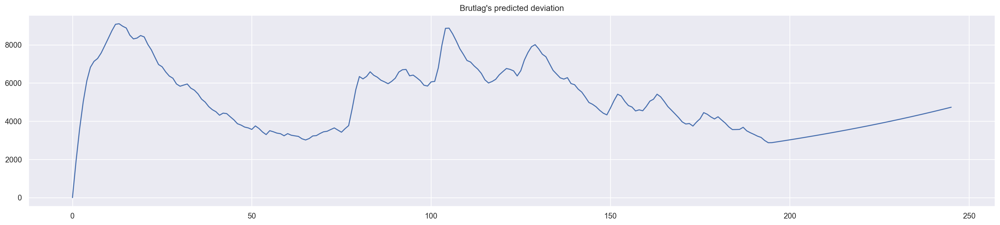

In [45]:
plt.figure(figsize=(25, 5))
plt.plot(model.PredictedDeviation)
plt.grid(True)
plt.axis("tight")
plt.title("Brutlag's predicted deviation");


سنطبق نفس الخوارزمية على السلسلة الثانية التي، كما تتذكر، لها اتجاه وموسمية مدتها 30 يومًا.


In [46]:
data = currency.GEMS_GEMS_SPENT[:-50]
slen = 30  # 30-day seasonality

x = [0, 0, 0]

opt = minimize(
    timeseriesCVscore,
    x0=x,
    args=(data, mean_absolute_percentage_error, slen),
    method="TNC",
    bounds=((0, 1), (0, 1), (0, 1)),
)

alpha_final, beta_final, gamma_final = opt.x
print(alpha_final, beta_final, gamma_final)

model = HoltWinters(
    data,
    slen=slen,
    alpha=alpha_final,
    beta=beta_final,
    gamma=gamma_final,
    n_preds=100,
    scaling_factor=3,
)
model.triple_exponential_smoothing()

0.013190344846993662 0.047616267647338284 0.0


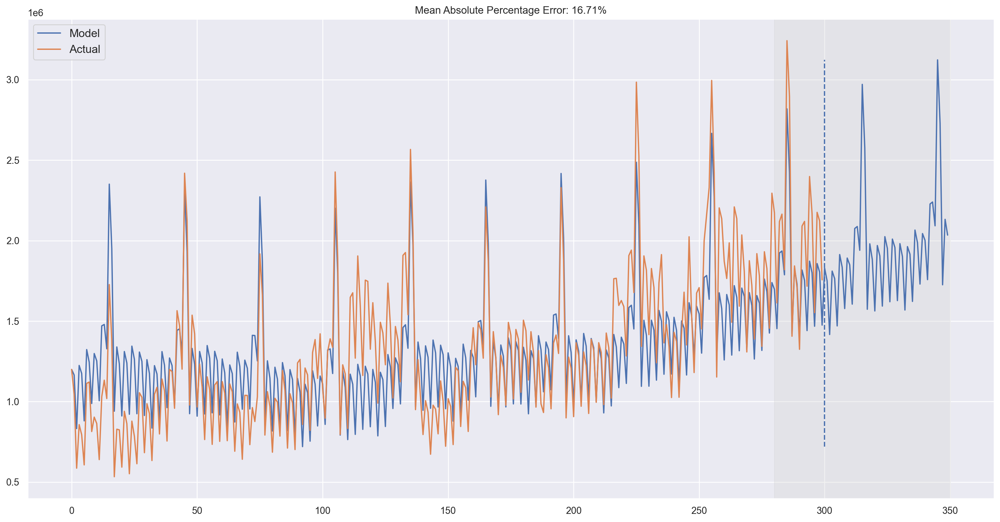

In [48]:
plotHoltWinters(model=model, series=currency.GEMS_GEMS_SPENT)


تبدو جيدة! وقد استحوذ النموذج على الاتجاه الصعودي والارتفاعات الموسمية ويتناسب مع البيانات بشكل جيد.


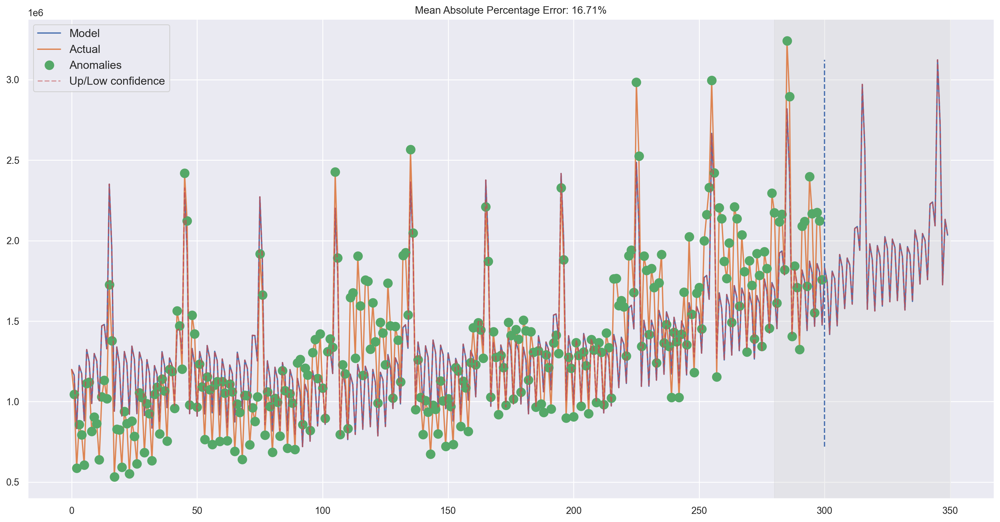

In [49]:
plotHoltWinters(model=model, series=currency.GEMS_GEMS_SPENT, plot_intervals=True, plot_anomalies=True)

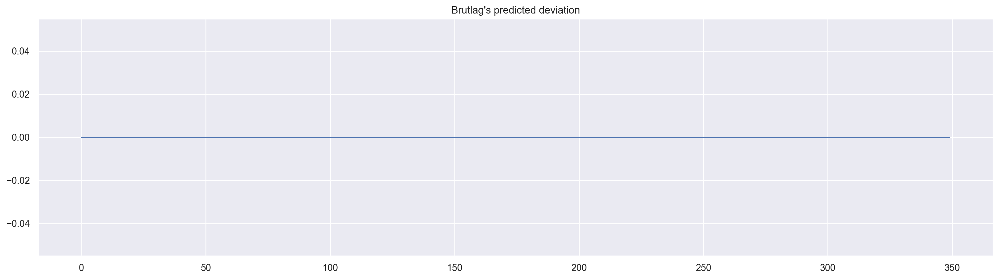

In [50]:
plt.figure(figsize=(20, 5))
plt.plot(model.PredictedDeviation)
plt.grid(True)
plt.axis("tight")
plt.title("Brutlag's predicted deviation");


# النهج الاقتصادي القياسي



###الثبات
قبل أن نبدأ في النمذجة، يجب أن نذكر خاصية مهمة للسلاسل الزمنية: [**الثبات**](https://en.wikipedia.org/wiki/Stationary_process).
إذا كانت العملية ثابتة، فهذا يعني أنها لا تغير خصائصها الإحصائية بمرور الوقت، أي متوسطها وتباينها. (يسمى ثبات التباين [التجانس](https://en.wikipedia.org/wiki/Homoscedasticity)) لا تعتمد وظيفة التباين على الوقت؛ يجب أن يعتمد فقط على المسافة بين الملاحظات. يمكنك رؤية ذلك بشكل مرئي في الصور الموجودة في المنشور بواسطة [شون أبو](http://www.seanabu.com/2016/03/22/time-series-seasonal-ARIMA-model-in-python/):
- الرسم البياني الأحمر أدناه ليس ثابتا لأن المتوسط يزداد مع مرور الوقت.
<img src="@@KEEP_00038@@>
- لم يحالفنا الحظ في التباين ونرى تباين انتشار القيم مع مرور الوقت
<img src="@@KEEP_00039@@>- وأخيرًا، لا ينبغي أن يكون التغاير بين الحد i والحد (i + m) دالة للزمن. في الرسم البياني التالي، ستلاحظ أن الفارق يصبح أقرب مع زيادة الوقت. ومن ثم، فإن التغاير ليس ثابتًا مع مرور الوقت في الرسم البياني الأيمن.
<img src="@@KEEP_00040@@>
فلماذا تعتبر الثبات مهمًا جدًا؟ لأنه من السهل إجراء تنبؤات على سلسلة ثابتة حيث يمكننا افتراض أن الخصائص الإحصائية المستقبلية لن تختلف عن تلك المرصودة حاليًا. تحاول معظم نماذج السلاسل الزمنية، بطريقة أو بأخرى، التنبؤ بتلك الخصائص (المتوسط ​​أو التباين، على سبيل المثال). ستكون التنبؤات المستقبلية خاطئة إذا لم تكن السلسلة الأصلية ثابتة. ولسوء الحظ، فإن معظم السلاسل الزمنية التي نراها خارج الكتب المدرسية غير ثابتة، ولكن يمكننا (وينبغي) تغيير هذا.
لذا، من أجل مكافحة عدم الاستقرار، علينا أن نعرف عدونا، إذا جاز التعبير. دعونا نرى كيف يمكننا اكتشافه. سنلقي نظرة على الضوضاء البيضاء والمشي العشوائي لمعرفة كيفية الانتقال من واحد إلى آخر مجانًا.



مخطط الضوضاء البيضاء:


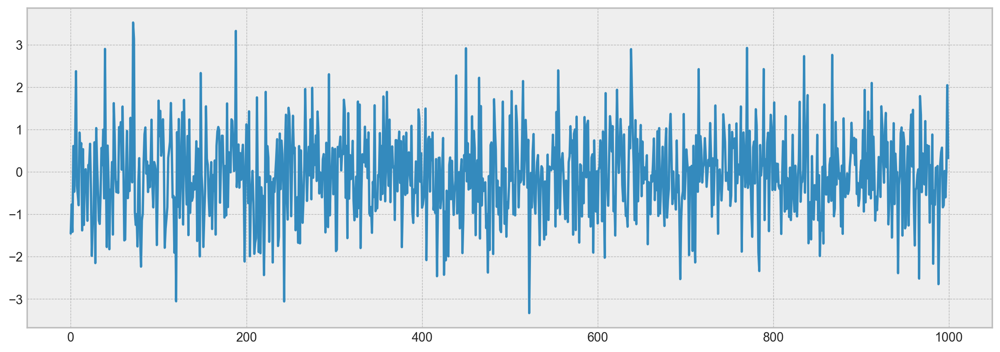

In [51]:
white_noise = np.random.normal(size=1000)
with plt.style.context("bmh"):
    plt.figure(figsize=(15, 5))
    plt.plot(white_noise)


العملية الناتجة عن التوزيع الطبيعي القياسي ثابتة وتتأرجح حول 0 مع انحراف قدره 1. الآن، بناءً على هذه العملية، سنقوم بإنشاء عملية جديدة حيث تعتمد كل قيمة لاحقة على القيمة السابقة: $x_t = \rho x_{t-1} + e_t$ 



هنا هو الكود لتقديم المؤامرات.


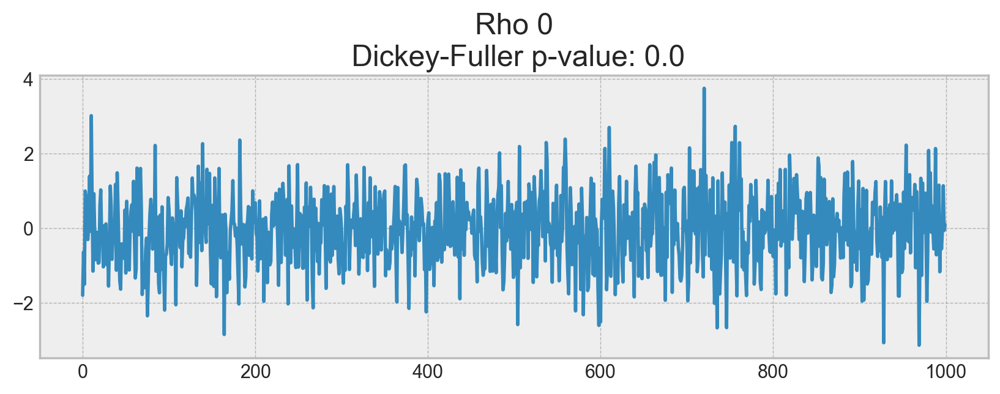

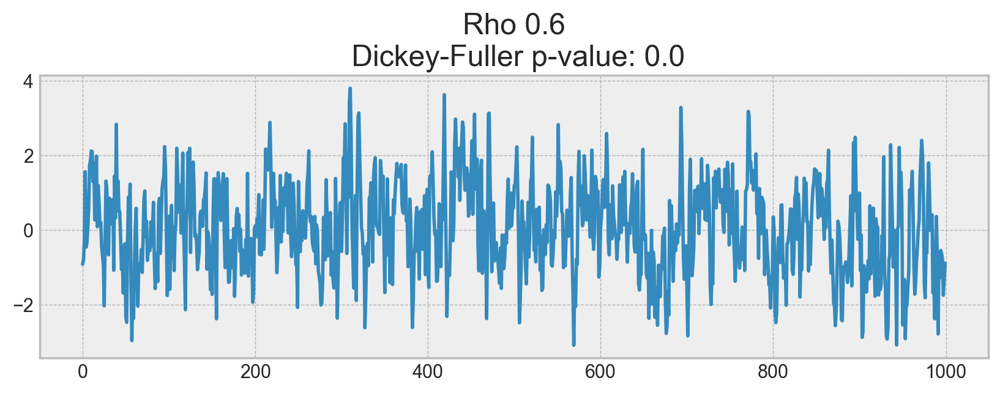

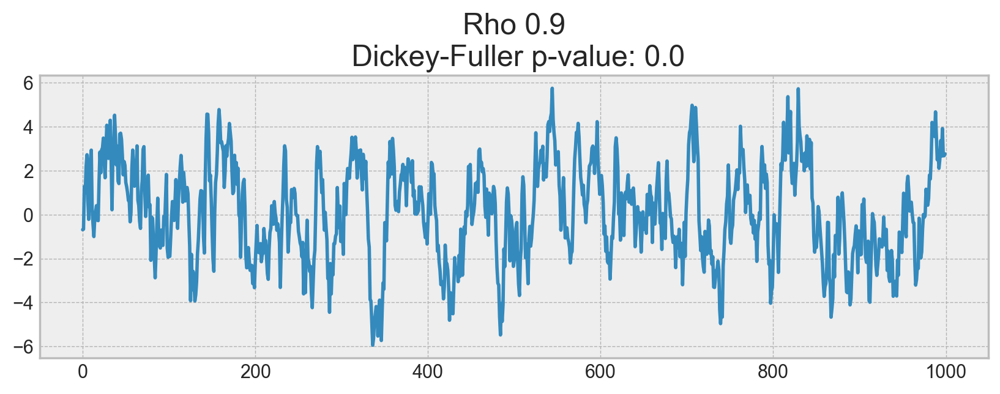

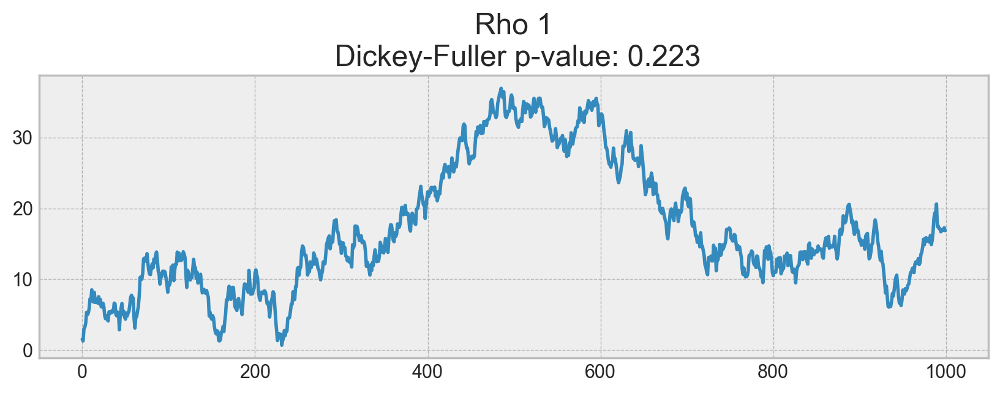

In [52]:
def plotProcess(n_samples=1000, rho=0):
    x = w = np.random.normal(size=n_samples)
    for t in range(n_samples):
        x[t] = rho * x[t - 1] + w[t]

    with plt.style.context("bmh"):
        plt.figure(figsize=(10, 3))
        plt.plot(x)
        plt.title(
            "Rho {}\n Dickey-Fuller p-value: {}".format(
                rho, round(sm.tsa.stattools.adfuller(x)[1], 3)
            )
        )


for rho in [0, 0.6, 0.9, 1]:
    plotProcess(rho=rho)


في المخطط الأول، يمكنك رؤية نفس الضوضاء البيضاء الثابتة كما كان من قبل. في المخطط الثاني مع زيادة $\rho$ إلى 0.6، ظهرت دورات أوسع، لكنها لا تزال تبدو ثابتة بشكل عام. ينحرف المخطط الثالث أكثر عن المتوسط ​​0 ولكنه لا يزال يتأرجح حول المتوسط. أخيرًا، مع $\rho=1$، لدينا عملية سير عشوائية، أي سلسلة زمنية غير ثابتة.يحدث هذا لأنه بعد الوصول إلى القيمة الحرجة، لا تعود السلسلة $x_t = \rho x_{t-1} + e_t$ إلى قيمتها المتوسطة. إذا طرحنا $x_{t-1}$ من كلا الطرفين، فسنحصل على $x_t - x_{t-1} = (\rho - 1) x_{t-1} + e_t$، حيث يُشار إلى التعبير الموجود على اليسار بالفرق الأول. إذا $\rho=1$، فإن الاختلاف الأول يعطينا ضوضاء بيضاء ثابتة $e_t$. هذه هي الفكرة الرئيسية وراء [اختبار ديكي-فولر](https://en.wikipedia.org/wiki/Dickey%E2%80%93Fuller_test) لثبات السلاسل الزمنية (اختبار وجود جذر الوحدة). إذا تمكنا من الحصول على سلسلة ثابتة من سلسلة غير ثابتة باستخدام الفرق الأول، فإننا نسمي تلك المتسلسلة متكاملة من الرتبة 1. الفرضية الصفرية للاختبار هي أن السلسلة الزمنية غير ثابتة، والتي تم رفضها في المخططات الثلاثة الأولى وتم قبولها أخيرًا في المخطط الأخير. علينا أن نقول أن الاختلاف الأول لا يكفي دائمًا للحصول على سلسلة ثابتة حيث قد تكون العملية متكاملة بالترتيب d، d > 1 (ولها جذور وحدات متعددة). في مثل هذه الحالات، يتم استخدام اختبار ديكي فولر المعزز، والذي يتحقق من فترات التأخر المتعددة في وقت واحد.
يمكننا محاربة عدم الثبات باستخدام أساليب مختلفة: اختلافات الترتيب المختلفة، وإزالة الاتجاه والموسمية، والتجانس، والتحويلات مثل Box-Cox أو اللوغاريتمي.



## التخلص من عدم الاستقرارية وبناء ساريما



دعونا نبني نموذج ARIMA من خلال السير عبر جميع ~~دوائر الجحيم~~ مراحل إنشاء سلسلة ثابتة.



هنا هو رمز لتقديم المؤامرات.


In [53]:
def tsplot(y, lags=None, figsize=(12, 7), style="bmh"):
    """
        Plot time series, its ACF and PACF, calculate Dickey–Fuller test
        
        y - timeseries
        lags - how many lags to include in ACF, PACF calculation
    """
    if not isinstance(y, pd.Series):
        y = pd.Series(y)

    with plt.style.context(style):
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))

        ts_ax.plot(y)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title(
            "Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}".format(p_value)
        )
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

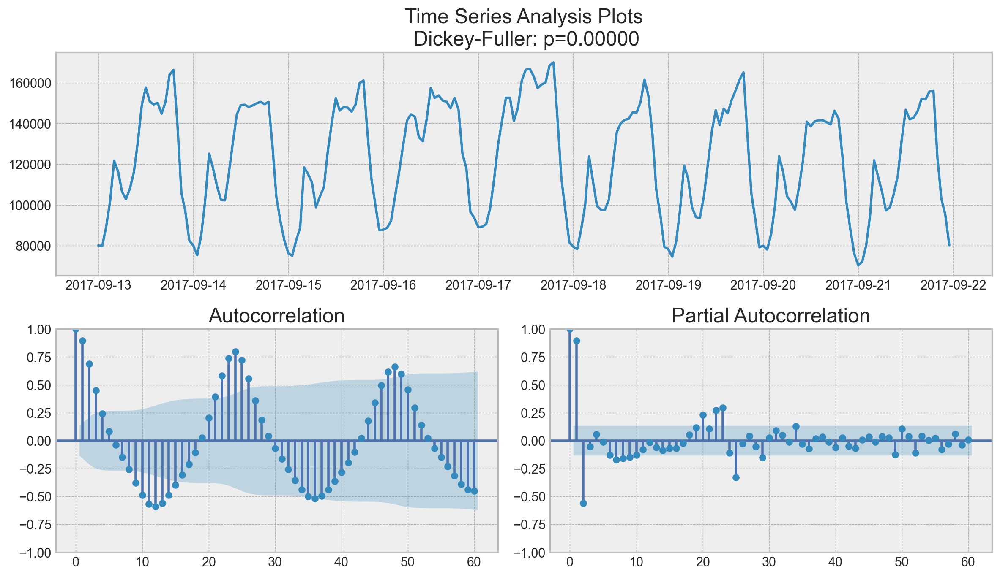

In [54]:
tsplot(ads.Ads, lags=60)


_تبدو هذه القيمة المتطرفة في مخطط الارتباط التلقائي الجزئي وكأنها خطأ في statsmodels، ويجب أن يكون الارتباط التلقائي الجزئي <= 1 مثل أي ارتباط._والمثير للدهشة أن السلسلة الأولية كانت ثابتة. رفض اختبار ديكي فولر فرضية العدم بوجود جذر الوحدة. في الواقع، يمكننا أن نرى هذا على المخطط نفسه - ليس لدينا اتجاه مرئي، وبالتالي فإن المتوسط ​​ثابت والتباين مستقر إلى حد كبير. الشيء الوحيد المتبقي هو الموسمية، والتي يتعين علينا التعامل معها قبل عرض الأزياء. للقيام بذلك، دعونا نأخذ "الفرق الموسمي"، وهو ما يعني طرح بسيط للسلسلة من نفسها مع تأخر يساوي الفترة الموسمية.


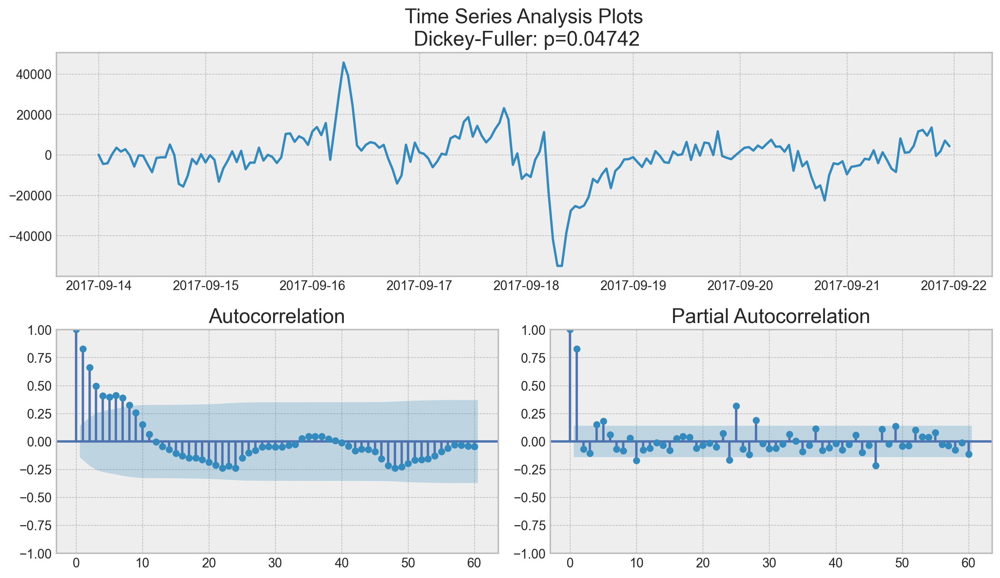

In [55]:
ads_diff = ads.Ads - ads.Ads.shift(24)
tsplot(ads_diff[24:], lags=60)


لقد أصبح الآن أفضل بكثير مع اختفاء الموسمية المرئية. ومع ذلك، لا تزال وظيفة الارتباط التلقائي بها فترات تأخير كبيرة جدًا. لإزالتها، سنأخذ الاختلافات الأولى، ونطرح السلسلة من نفسها بتأخر 1.


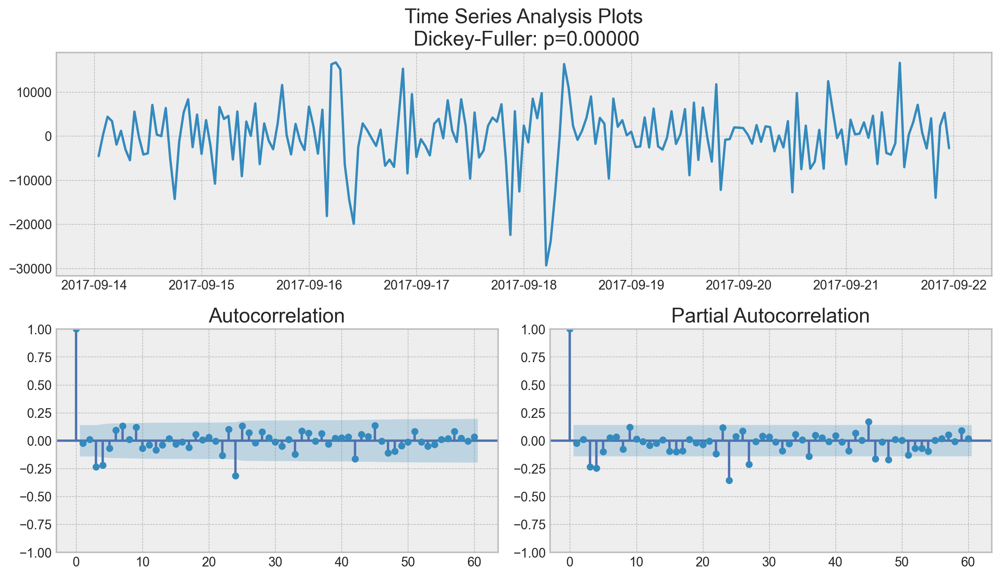

In [56]:
ads_diff = ads_diff - ads_diff.shift(1)
tsplot(ads_diff[24 + 1 :], lags=60)


مثالي! تبدو المتسلسلة الآن وكأنها شيء لا يمكن وصفه، ويتأرجح حول الصفر. يشير اختبار ديكي-فولر إلى أنه ثابت، وأن عدد القمم المهمة في ACF قد انخفض. يمكننا أخيرا أن نبدأ النمذجة!



## دورة مكثفة لعائلة ARIMA
وسنشرح هذا النموذج من خلال بناء حرف بحرف. $SARIMA(p, d, q)(P, D, Q, s)$، نموذج المتوسط ​​المتحرك للانحدار التلقائي الموسمي:- $AR(p)$ - نموذج الانحدار الذاتي، أي انحدار السلسلة الزمنية إلى نفسها. الافتراض الأساسي هو أن قيم السلسلة الحالية تعتمد على قيمها السابقة مع بعض التأخير (أو عدة فترات تأخير). يُشار إلى الحد الأقصى للتأخير في النموذج بـ $p$. لتحديد $p$ الأولي، تحتاج إلى إلقاء نظرة على مخطط PACF والعثور على أكبر تأخر كبير يصبح بعده معظم فترات التأخير الأخرى غير ذات أهمية.
- $MA(q)$ - نموذج المتوسط ​​المتحرك. بدون الخوض في الكثير من التفاصيل، يقوم هذا النموذج بنمذجة خطأ السلسلة الزمنية، مرة أخرى مع افتراض أن الخطأ الحالي يعتمد على الخطأ السابق مع بعض التأخير، والذي يشار إليه باسم $q$. يمكن العثور على القيمة الأولية في مخطط ACF بنفس المنطق كما كان من قبل. 
دعونا نجمع الحروف الأربعة الأولى لدينا:
$AR(p) + MA(q) = ARMA(p, q)$
ما لدينا هنا هو نموذج الانحدار الذاتي-المتوسط المتحرك! إذا كانت السلسلة ثابتة فيمكن تقريبها بهذه الأحرف الأربعة. دعونا نستمر.
- $I(d)$ - ترتيب التكامل. وهذا ببساطة هو عدد الاختلافات غير الموسمية اللازمة لجعل السلسلة ثابتة. في حالتنا، هو 1 فقط لأننا استخدمنا الاختلافات الأولى. 
إن إضافة هذا الحرف إلى الأربعة يعطينا نموذج $ARIMA$ الذي يمكنه التعامل مع البيانات غير الثابتة بمساعدة الاختلافات غير الموسمية. عظيم، رسالة أخرى للذهاب!
- $S(s)$ - هذا هو المسؤول عن الموسمية ويساوي طول فترة الموسم للمسلسل
وبهذا، لدينا ثلاث معلمات: $(P, D, Q)$- $P$ - ترتيب الانحدار التلقائي للمكون الموسمي للنموذج، والذي يمكن استخلاصه من PACF. ولكن عليك أن تنظر إلى عدد فترات التأخر الكبيرة، وهي مضاعفات طول فترة الموسم. على سبيل المثال، إذا كانت الفترة تساوي 24 ورأينا أن التأخرين 24 و48 مهمان في PACF، فهذا يعني أن $P$ الأولي يجب أن يكون 2.
- $Q$ - منطق مماثل باستخدام مخطط ACF بدلاً من ذلك.
- $D$ - ترتيب التكامل الموسمي. يمكن أن يساوي هذا 1 أو 0، اعتمادًا على ما إذا تم تطبيق الفروق الموسمية أم لا.



الآن بعد أن عرفنا كيفية تعيين المعلمات الأولية، دعونا نلقي نظرة على المخطط النهائي مرة أخرى ونقوم بتعيين المعلمات:


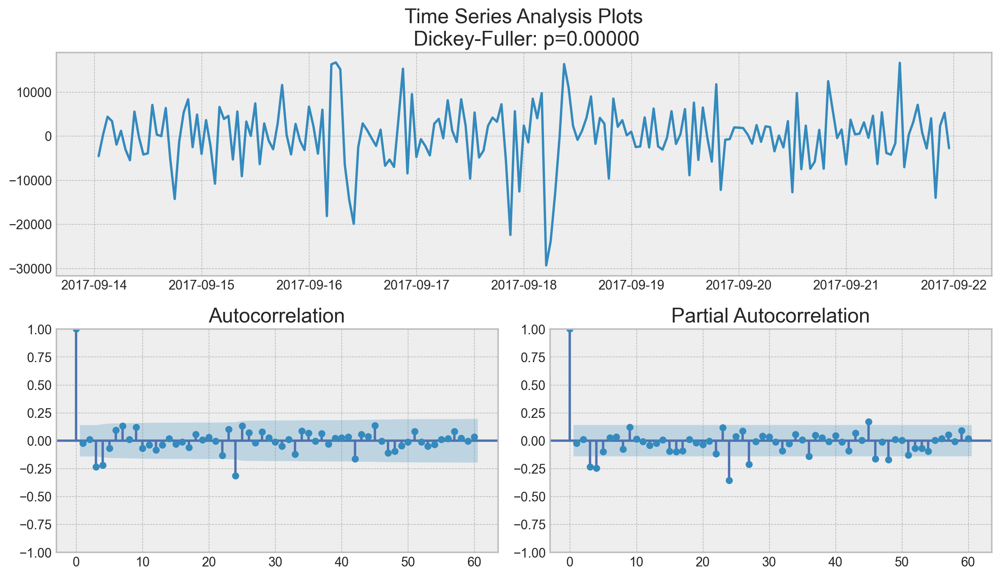

In [57]:
tsplot(ads_diff[24 + 1 :], lags=60)


- $p$ هو على الأرجح 4 لأنه آخر تأخر كبير في PACF، وبعد ذلك، معظم الآخرين ليسوا مهمين. 
- $d$ يساوي 1 لأنه كانت لدينا الاختلافات الأولى
- $q$ يجب أن يكون في مكان ما حوالي 4 كما يمكن رؤيته على ACF
- $P$ قد تكون 2، نظرًا لأن التأخرين 24 و48 مهمان إلى حد ما في PACF
- $D$ يساوي 1 مرة أخرى لأننا أجرينا التمايز الموسمي
- $Q$ ربما يكون 1. التأخر 24 في ACF مهم بينما الـ 48 ليس كذلك.



دعونا نختبر نماذج مختلفة ونرى أي منها أفضل.


In [58]:
# setting initial values and some bounds for them
ps = range(2, 5)
d = 1
qs = range(2, 5)
Ps = range(0, 2)
D = 1
Qs = range(0, 2)
s = 24  # season length is still 24

# creating list with all the possible combinations of parameters
parameters = product(ps, qs, Ps, Qs)
parameters_list = list(parameters)
len(parameters_list)

36

In [59]:
def optimizeSARIMA(parameters_list, d, D, s):
    """
        Return dataframe with parameters and corresponding AIC
        
        parameters_list - list with (p, q, P, Q) tuples
        d - integration order in ARIMA model
        D - seasonal integration order 
        s - length of season
    """

    results = []
    best_aic = float("inf")

    for param in tqdm(parameters_list):
        # we need try-except because on some combinations model fails to converge
        try:
            model = sm.tsa.statespace.SARIMAX(
                ads.Ads,
                order=(param[0], d, param[1]),
                seasonal_order=(param[2], D, param[3], s),
            ).fit(disp=-1)
        except:
            continue
        aic = model.aic
        # saving best model, AIC and parameters
        if aic < best_aic:
            best_model = model
            best_aic = aic
            best_param = param
        results.append([param, model.aic])

    result_table = pd.DataFrame(results)
    result_table.columns = ["parameters", "aic"]
    # sorting in ascending order, the lower AIC is - the better
    result_table = result_table.sort_values(by="aic", ascending=True).reset_index(
        drop=True
    )

    return result_table

In [60]:
%time
result_table = optimizeSARIMA(parameters_list, d, D, s)

CPU times: user 2 μs, sys: 1 μs, total: 3 μs
Wall time: 3.81 μs


  0%|          | 0/36 [00:00<?, ?it/s]

In [61]:
result_table.head()

,parameters,aic
0,"(2, 3, 1, 1)",3888.642174
1,"(3, 2, 1, 1)",3888.763568
2,"(4, 2, 1, 1)",3890.279740
3,"(3, 3, 1, 1)",3890.513196
4,"(2, 4, 1, 1)",3892.302849


In [62]:
# set the parameters that give the lowest AIC
p, q, P, Q = result_table.parameters[0]

best_model = sm.tsa.statespace.SARIMAX(
    ads.Ads, order=(p, d, q), seasonal_order=(P, D, Q, s)
).fit(disp=-1)
print(best_model.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                  Ads   No. Observations:                  216
Model:             SARIMAX(2, 1, 3)x(1, 1, [1], 24)   Log Likelihood               -1936.321
Date:                              Mon, 06 Jan 2025   AIC                           3888.642
Time:                                      17:05:11   BIC                           3914.660
Sample:                                  09-13-2017   HQIC                          3899.181
                                       - 09-21-2017                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7913      0.270      2.928      0.003       0.262       1.321
ar.L2         -0.55


دعونا نتفحص بقايا النموذج.


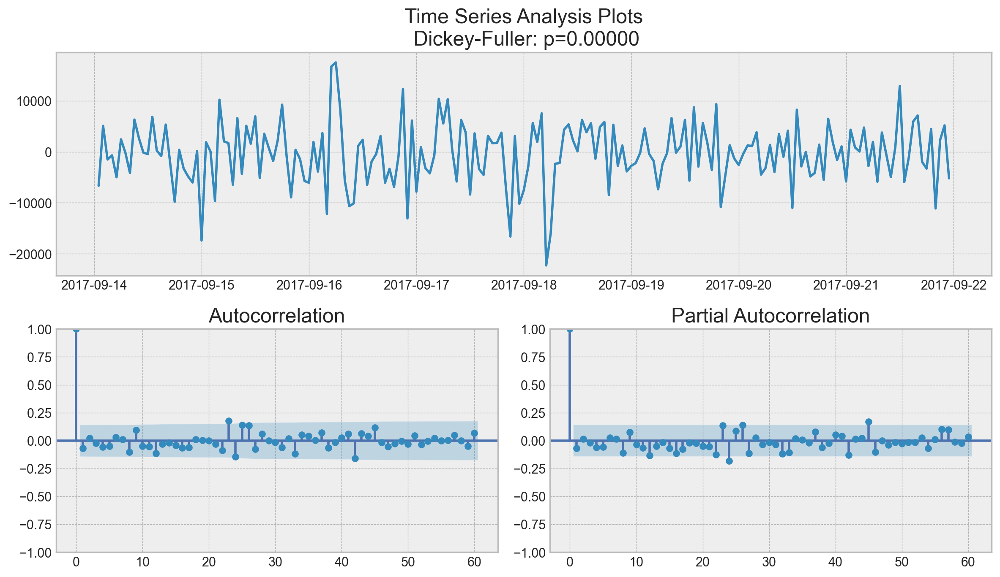

In [63]:
tsplot(best_model.resid[24 + 1 :], lags=60)


ومن الواضح أن البقايا ثابتة، ولا توجد ارتباطات ذاتية واضحة. دعونا نجعل التنبؤات باستخدام نموذجنا.


In [70]:
def plotSARIMA(series, model, n_steps):
    """
        Plots model vs predicted values
        
        series - dataset with timeseries
        model - fitted SARIMA model
        n_steps - number of steps to predict in the future
        
    """
    # adding model values
    data = series.copy()
    data.columns = ["actual"]
    data["arima_model"] = model.fittedvalues
    # making a shift on s+d steps, because these values were unobserved by the model
    # due to the differentiating
    data["arima_model"][: s + d] = np.nan

    # forecasting on n_steps forward
    forecast = model.predict(start=data.shape[0], end=data.shape[0] + n_steps)
    # calculate error, again having shifted on s+d steps from the beginning
    error = mean_absolute_percentage_error(
        data["actual"][s + d :], data["arima_model"][s + d :]
    )

    plt.figure(figsize=(15, 7))
    plt.title("Mean Absolute Percentage Error: {0:.2f}%".format(error))
    plt.plot(forecast, color="r", label="model")
    plt.axvspan(data.index[-1], forecast.index[-1], alpha=0.5, color="lightgrey")
    plt.plot(data.actual, label="actual")
    plt.legend()
    plt.grid(True);

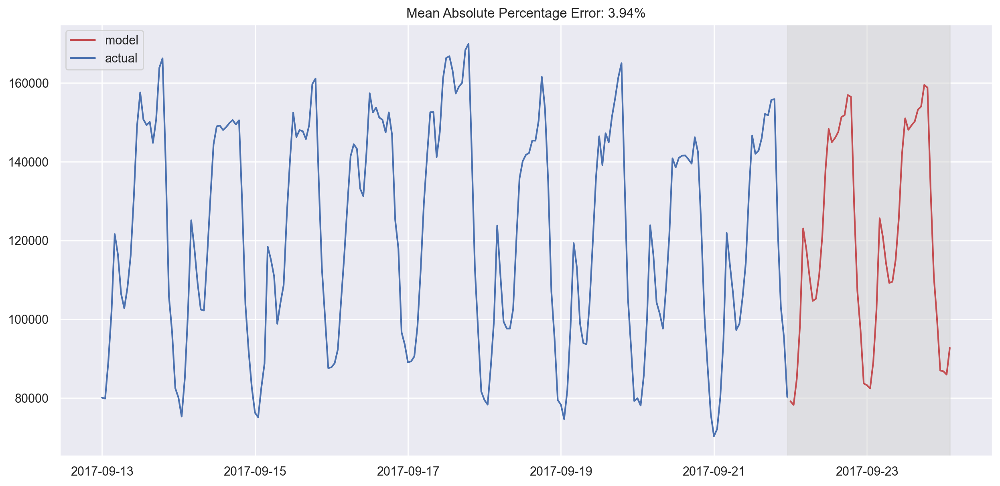

In [71]:
plotSARIMA(ads, best_model, 50)


وفي النهاية، حصلنا على تنبؤات كافية للغاية. لقد كان نموذجنا خاطئًا بنسبة 4.01% في المتوسط، وهو أمر جيد جدًا. ومع ذلك، فإن التكاليف الإجمالية لإعداد البيانات، وجعل السلسلة ثابتة، واختيار المعلمات قد لا تستحق هذه الدقة.


# النماذج الخطية (وليست تمامًا) للسلاسل الزمنية
في كثير من الأحيان، في وظيفتي، يتعين علي إنشاء نماذج باستخدام [*سريعة وجيدة ورخيصة*](http://fastgood.cheap) كمبدأ توجيهي الوحيد. وهذا يعني أن بعض هذه النماذج لن يتم اعتبارها أبدًا "جاهزة للإنتاج" لأنها تتطلب الكثير من الوقت لإعداد البيانات (كما هو الحال في SRIMA) أو تتطلب إعادة تدريب متكررة على البيانات الجديدة (مرة أخرى، SRIMA) أو يصعب ضبطها (مثال جيد - SRIMA). لذلك، غالبًا ما يكون من الأسهل تحديد بعض الميزات من السلسلة الزمنية الحالية وإنشاء نموذج انحدار خطي بسيط أو، على سبيل المثال، غابة عشوائية. انها جيدة ورخيصة.
هذا النهج غير مدعوم من الناحية النظرية ويكسر العديد من الافتراضات (مثل نظرية غاوس-ماركوف، خاصة بالنسبة للأخطاء غير المترابطة)، ولكنه مفيد جدًا في الممارسة العملية وغالبًا ما يستخدم في مسابقات التعلم الآلي.



## استخراج الميزة



يحتاج النموذج إلى ميزات، وكل ما لدينا هو سلسلة زمنية أحادية البعد. ما هي الميزات التي يمكننا استخراجها؟ 
* السلاسل الزمنية متخلفة
* إحصائيات النافذة:
    - الحد الأقصى/الدقيقة لقيمة السلسلة في النافذة
    - القيمة المتوسطة/المتوسطة في النافذة
    - تباين النافذة
    - الخ.
* ميزات التاريخ والوقت:
    - دقيقة ساعة، ساعة من اليوم، يوم من أيام الأسبوع، وهكذا
    - هل هذا اليوم عطلة؟ ربما هناك حدث خاص؟ قم بتمثيل ذلك كميزة منطقية
* ترميز الهدف 
* التوقعات من النماذج الأخرى (لاحظ أننا يمكن أن نفقد سرعة التنبؤ بهذه الطريقة)



فلنستعرض بعض الأساليب ونرى ما يمكننا استخلاصه من بيانات السلسلة الزمنية لإعلاناتنا.
## تأخر السلاسل الزمنيةبإزاحة السلسلة $n$ للخلف، نحصل على عمود ميزة حيث تتماشى القيمة الحالية للسلسلة الزمنية مع قيمتها في الوقت $t-n$. إذا قمنا بإجراء تحول متأخر بمقدار 1 وقمنا بتدريب نموذج على هذه الميزة، فسيكون النموذج قادرًا على التنبؤ بخطوة واحدة للأمام من ملاحظة الحالة الحالية للسلسلة. إن زيادة الفارق، على سبيل المثال، حتى 6، سيسمح للنموذج بالتنبؤ بـ 6 خطوات للأمام؛ ومع ذلك فإنه سيتم استخدام البيانات التي تمت ملاحظتها 6 خطوات إلى الوراء. إذا قام شيء ما بتغيير السلسلة بشكل أساسي خلال تلك الفترة غير الملحوظة، فلن يتمكن النموذج من التقاط هذه التغييرات وسيقوم بإرجاع التنبؤات مع وجود خطأ كبير. لذلك، أثناء الاختيار الأولي للتأخر، يتعين على المرء إيجاد توازن بين جودة التنبؤ المثالية وطول أفق التنبؤ.


In [ ]:
# Creating a copy of the initial datagrame to make various transformations
data = pd.DataFrame(ads.Ads.copy())
data.columns = ["y"]

In [ ]:
# Adding the lag of the target variable from 6 steps back up to 24
for i in range(6, 25):
    data["lag_{}".format(i)] = data.y.shift(i)

In [ ]:
# take a look at the new dataframe
data.tail(7)


عظيم، لقد أنشأنا مجموعة بيانات هنا. لماذا لا نقوم الآن بتدريب نموذج؟ 


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

# for time-series cross-validation set 5 folds
tscv = TimeSeriesSplit(n_splits=5)

In [ ]:
def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """

    # get the index after which test set starts
    test_index = int(len(X) * (1 - test_size))

    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]

    return X_train, X_test, y_train, y_test

In [ ]:
y = data.dropna().y
X = data.dropna().drop(["y"], axis=1)

# reserve 30% of data for testing
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

In [ ]:
# machine learning in two lines
lr = LinearRegression()
lr.fit(X_train, y_train)

In [ ]:
def plotModelResults(
    model, X_train=X_train, X_test=X_test, plot_intervals=False, plot_anomalies=False
):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """

    prediction = model.predict(X_test)

    plt.figure(figsize=(15, 7))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)

    if plot_intervals:
        cv = cross_val_score(
            model, X_train, y_train, cv=tscv, scoring="neg_mean_absolute_error"
        )
        mae = cv.mean() * (-1)
        deviation = cv.std()

        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)

        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)

        if plot_anomalies:
            anomalies = np.array([np.nan] * len(y_test))
            anomalies[y_test < lower] = y_test[y_test < lower]
            anomalies[y_test > upper] = y_test[y_test > upper]
            plt.plot(anomalies, "o", markersize=10, label="Anomalies")

    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True)


def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """

    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)

    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind="bar")
    plt.grid(True, axis="y")
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles="dashed");

In [ ]:
plotModelResults(lr, plot_intervals=True)
plotCoefficients(lr)


لقد أعطتنا التأخيرات البسيطة والانحدار الخطي تنبؤات ليست بعيدة عن SRIMA من حيث الجودة. هناك العديد من الميزات غير الضرورية، لذلك سنقوم باختيار الميزات بعد قليل. في الوقت الحالي، دعونا نواصل الهندسة!



سنضيف ساعة ويومًا من الأسبوع وقيمة منطقية لـ `is_weekend`. للقيام بذلك، نحتاج إلى تحويل فهرس إطار البيانات الحالي إلى تنسيق `datetime` واستخراج `hour` و`weekday`.


In [ ]:
data.index = pd.to_datetime(data.index)
data["hour"] = data.index.hour
data["weekday"] = data.index.weekday
data["is_weekend"] = data.weekday.isin([5, 6]) * 1
data.tail()


يمكننا تصور الميزات الناتجة.


In [ ]:
plt.figure(figsize=(16, 5))
plt.title("Encoded features")
data.hour.plot()
data.weekday.plot()
data.is_weekend.plot()
plt.grid(True);


نظرًا لأن لدينا الآن مقاييس مختلفة في متغيراتنا، الآلاف للميزات المتأخرة والعشرات للفئات، نحتاج إلى تحويلها إلى نفس المقياس لاستكشاف أهمية الميزات، ثم التنظيم لاحقًا. 


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [ ]:
y = data.dropna().y
X = data.dropna().drop(["y"], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True)
plotCoefficients(lr)


خطأ الاختبار ينخفض قليلاً. انطلاقًا من مخطط المعاملات، يمكننا القول أن `weekday` و`is_weekend` من الميزات المفيدة.


## ترميز الهدف
أرغب في إضافة متغير آخر لتشفير المتغيرات الفئوية: التشفير حسب القيمة المتوسطة. إذا كان من غير المرغوب فيه تفجير مجموعة بيانات باستخدام العديد من المتغيرات الوهمية التي يمكن أن تؤدي إلى فقدان المعلومات وإذا لم يكن من الممكن استخدامها كقيم حقيقية بسبب التعارضات مثل "0 ساعة < 23 ساعة"، فمن الممكن تشفير متغير بقيم أكثر قابلية للتفسير قليلاً. الفكرة الطبيعية هي التشفير بالقيمة المتوسطة للمتغير المستهدف. في مثالنا، يمكن تشفير كل يوم من أيام الأسبوع وكل ساعة من اليوم من خلال متوسط ​​عدد الإعلانات المقابلة التي تمت مشاهدتها خلال ذلك اليوم أو تلك الساعة. من المهم جدًا التأكد من حساب القيمة المتوسطة على مجموعة التدريب فقط (أو على طية التحقق المتبادل الحالية فقط) بحيث لا يكون النموذج على علم بالمستقبل.


In [ ]:
def code_mean(data, cat_feature, real_feature):
    """
    Returns a dictionary where keys are unique categories of the cat_feature,
    and values are means over real_feature
    """
    return dict(data.groupby(cat_feature)[real_feature].mean())


دعونا نلقي نظرة على المتوسطات بالساعة.


In [ ]:
average_hour = code_mean(data, "hour", "y")
plt.figure(figsize=(7, 5))
plt.title("Hour averages")
pd.DataFrame.from_dict(average_hour, orient="index")[0].plot()
plt.grid(True);


أخيرًا، دعونا نجمع كل التحويلات معًا في دالة واحدة.


In [ ]:
def prepareData(series, lag_start, lag_end, test_size, target_encoding=False):
    """
        series: pd.DataFrame
            dataframe with timeseries

        lag_start: int
            initial step back in time to slice target variable 
            example - lag_start = 1 means that the model 
                      will see yesterday's values to predict today

        lag_end: int
            final step back in time to slice target variable
            example - lag_end = 4 means that the model 
                      will see up to 4 days back in time to predict today

        test_size: float
            size of the test dataset after train/test split as percentage of dataset

        target_encoding: boolean
            if True - add target averages to the dataset
        
    """

    # copy of the initial dataset
    data = pd.DataFrame(series.copy())
    data.columns = ["y"]

    # lags of series
    for i in range(lag_start, lag_end):
        data["lag_{}".format(i)] = data.y.shift(i)

    # datetime features
    data.index = pd.to_datetime(data.index)
    data["hour"] = data.index.hour
    data["weekday"] = data.index.weekday
    data["is_weekend"] = data.weekday.isin([5, 6]) * 1

    if target_encoding:
        # calculate averages on train set only
        test_index = int(len(data.dropna()) * (1 - test_size))
        data["weekday_average"] = list(
            map(code_mean(data[:test_index], "weekday", "y").get, data.weekday)
        )
        data["hour_average"] = list(
            map(code_mean(data[:test_index], "hour", "y").get, data.hour)
        )

        # drop encoded variables
        data.drop(["hour", "weekday"], axis=1, inplace=True)

    # train-test split
    y = data.dropna().y
    X = data.dropna().drop(["y"], axis=1)
    X_train, X_test, y_train, y_test = timeseries_train_test_split(
        X, y, test_size=test_size
    )

    return X_train, X_test, y_train, y_test

In [ ]:
X_train, X_test, y_train, y_test = prepareData(
    ads.Ads, lag_start=6, lag_end=25, test_size=0.3, target_encoding=True
)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(
    lr,
    X_train=X_train_scaled,
    X_test=X_test_scaled,
    plot_intervals=True,
    plot_anomalies=True,
)
plotCoefficients(lr)


نرى بعض ** التجهيز الزائد **! `Hour_average` كان رائعًا جدًا في مجموعة بيانات التدريب لدرجة أن النموذج قرر تركيز كل قواه عليها. ونتيجة لذلك، انخفضت جودة التنبؤ. يمكن حل هذه المشكلة بعدة طرق؛ على سبيل المثال، يمكننا حساب الترميز المستهدف ليس لمجموعة القطار بأكملها، ولكن لبعض النوافذ بدلاً من ذلك. بهذه الطريقة، من المرجح أن تصف الترميزات من آخر نافذة تمت ملاحظتها حالة السلسلة الحالية بشكل أفضل. وبدلاً من ذلك، يمكننا فقط إسقاطها يدويًا لأننا على يقين من أنها تزيد الأمور سوءًا في هذه الحالة. 


In [ ]:
X_train, X_test, y_train, y_test = prepareData(
    ads.Ads, lag_start=6, lag_end=25, test_size=0.3, target_encoding=False
)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


## التنظيم واختيار الميزاتكما نعلم بالفعل، ليست كل الميزات تتمتع بنفس القدر من الصحة - فبعضها قد يؤدي إلى الإفراط في التجهيز بينما يجب إزالة البعض الآخر. إلى جانب الفحص اليدوي، يمكننا تطبيق التسوية. اثنان من نماذج الانحدار الأكثر شيوعًا مع التنظيم هما انحدارات Ridge و Lasso. كلاهما يضيف المزيد من القيود إلى دالة الخسارة لدينا. 
في حالة انحدار ريدج، تكون تلك القيود هي مجموع مربعات المعاملات مضروبة في معامل التنظيم. كلما زاد معامل الميزة، كلما كانت خسارتنا أكبر. ومن ثم، سنحاول تحسين النموذج مع الحفاظ على المعاملات منخفضة إلى حد ما. 
نتيجة لهذا التنظيم $L2$، سيكون لدينا انحياز أعلى وتباين أقل، وبالتالي سيتم تعميم النموذج بشكل أفضل (على الأقل هذا ما نأمل أن يحدث).
يضيف نموذج الانحدار الثاني، انحدار لاسو، إلى دالة الخسارة، ليس المربعات، ولكن القيم المطلقة للمعاملات. ونتيجة لذلك، أثناء عملية التحسين، قد تصبح معاملات الميزات غير المهمة أصفارًا، مما يسمح باختيار الميزات تلقائيًا. يُسمى نوع التنظيم هذا $L1$. 



أولاً، دعونا نتأكد من أن لدينا ميزات يجب إسقاطها وأن البيانات تحتوي على ميزات مترابطة بشكل كبير.


In [ ]:
plt.figure(figsize=(10, 8))
sns.heatmap(X_train.corr());

In [ ]:
from sklearn.linear_model import LassoCV, RidgeCV

ridge = RidgeCV(cv=tscv)
ridge.fit(X_train_scaled, y_train)

plotModelResults(
    ridge,
    X_train=X_train_scaled,
    X_test=X_test_scaled,
    plot_intervals=True,
    plot_anomalies=True,
)
plotCoefficients(ridge)


يمكننا أن نرى بوضوح أن بعض المعاملات تقترب أكثر فأكثر من الصفر (على الرغم من أنها لا تصل إليه أبدًا) مع انخفاض أهميتها في النموذج.


In [ ]:
lasso = LassoCV(cv=tscv)
lasso.fit(X_train_scaled, y_train)

plotModelResults(
    lasso,
    X_train=X_train_scaled,
    X_test=X_test_scaled,
    plot_intervals=True,
    plot_anomalies=True,
)
plotCoefficients(lasso)


تبين أن انحدار لاسو أكثر تحفظًا؛ لقد أزال التأخر الثالث والعشرون من أهم الميزات وأسقط 5 ميزات بالكامل، مما أدى إلى تحسين جودة التنبؤ.



# التعزيز 
لماذا لا نحاول تجربة XGBoost الآن؟
<img src="../../img/xgboost_the_things.jpg"/>


In [ ]:
from xgboost import XGBRegressor

xgb = XGBRegressor(verbosity=0)
xgb.fit(X_train_scaled, y_train);

In [ ]:
plotModelResults(
    xgb,
    X_train=X_train_scaled,
    X_test=X_test_scaled,
    plot_intervals=True,
    plot_anomalies=True,
)

لدينا فائز! وهذا هو أصغر خطأ في مجموعة الاختبار بين جميع النماذج التي جربناها حتى الآن. 
لكن هذا النصر خادع، وقد لا تكون الفكرة الأكثر سطوعًا هي ملاءمة `xgboost` بمجرد حصولك على بيانات السلاسل الزمنية. بشكل عام، تتعامل النماذج المبنية على الشجرة مع اتجاهات البيانات بشكل سيئ عند مقارنتها بالنماذج الخطية. في هذه الحالة، سيتعين عليك تغيير اتجاه سلسلتك أولاً أو استخدام بعض الحيل لتحقيق السحر. من الناحية المثالية، يمكنك جعل السلسلة ثابتة ثم استخدام XGBoost. على سبيل المثال، يمكنك التنبؤ بالاتجاه بشكل منفصل باستخدام نموذج خطي ثم إضافة تنبؤات من `xgboost` للحصول على توقعات نهائية.



#الخلاصة
ناقشنا طرق تحليل السلاسل الزمنية المختلفة والتنبؤ بها. لسوء الحظ، أو ربما لحسن الحظ، لا توجد طريقة واحدة لحل هذا النوع من المشاكل. لا تزال الأساليب التي تم تطويرها في الستينيات (وبعضها حتى في بداية القرن الحادي والعشرين) شائعة، إلى جانب LSTMs وRNNs (لم تتم تغطيتها في هذه المقالة). ويرتبط هذا جزئيًا بحقيقة أن مهمة التنبؤ، مثل أي مهمة أخرى متعلقة بالبيانات، تتطلب الإبداع في العديد من الجوانب وتتطلب بالتأكيد البحث. على الرغم من العدد الكبير من مقاييس الجودة والأساليب الرسمية لتقدير المعلمات، فإنه غالبًا ما يكون من الضروري تجربة شيء مختلف لكل سلسلة زمنية. وأخيرًا وليس آخرًا، يعد التوازن بين الجودة والتكلفة أمرًا مهمًا. كمثال جيد، يمكن أن ينتج نموذج SRIMA نتائج مذهلة بعد الضبط ولكنه قد يتطلب ساعات عديدة من ~~رقص الدف~~ معالجة السلاسل الزمنية بينما يمكن بناء نموذج الانحدار الخطي البسيط في 10 دقائق ويمكنه تحقيق نتائج قابلة للمقارنة إلى حد ما.



# مصادر مفيدة* نفس دفتر الملاحظات المستخدم على الويب التفاعلي [Kaggle Kernel](https://www.kaggle.com/kashnitsky/topic-9-part-1-time-series-analysis-in-python)
* "شبكات LSTM (الذاكرة طويلة المدى) للتنبؤ بالسلاسل الزمنية" - برنامج تعليمي بواسطة Max Sergei Bulaev ضمن mlcourse.ai (القائمة الكاملة للبرامج التعليمية موجودة [هنا](https://mlcourse.ai/tutorials))
* الطبق الرئيسي [الموقع](https://mlcourse.ai)، [مستودع الدورة](https://github.com/Yorko/mlcourse.ai)، ويوتيوب [القناة](https://www.youtube.com/watch?v=QKTuw4PNOsU&list=PLVlY_7IJCMJeRfZ68eVfEcu-UcN9BbwiX)
* مواد الدورة التدريبية باعتبارها [مجموعة بيانات Kaggle](https://www.kaggle.com/kashnitsky/mlcourse)
* متوسط ["قصة"](https://medium.com/open-machine-learning-course/open-machine-learning-course-topic-9-time-series-analysis-in-python-a270cb05e0b3?source=collection_home---6------2---------------------) استنادًا إلى دفتر الملاحظات هذا
* إذا كنت تقرأ اللغة الروسية: [مقال](https://habr.com/ru/company/ods/blog/327242/) على موقع Habr.com يحتوي على نفس المادة. و[محاضرة](https://youtu.be/_9lBwXnbOd8) على اليوتيوب
* [كتاب مدرسي عبر الإنترنت] (https://people.duke.edu/~rnau/411home.htm) لدورة التنبؤ الإحصائي المتقدمة في جامعة ديوك - يغطي تقنيات التجانس المختلفة بالتفصيل إلى جانب النماذج الخطية ونماذج ARIMA
* [مقارنة نماذج السلاسل الزمنية ARIMA وRandom Forest للتنبؤ بتفشي أنفلونزا الطيور H5N1](https://bmcbioinformatics.biomedcentral.com/articles/10.1186/1471-2105-15-276) - واحدة من الحالات القليلة التي يتم فيها الدفاع بشكل فعال عن استخدام الغابة العشوائية للتنبؤ بالسلاسل الزمنية
* [تحليل السلاسل الزمنية (TSA) في بايثون - النماذج الخطية إلى GARCH](http://www.blackarbs.com/blog/time-series-analysis-in-python-linear-models-to-garch/11/1/2016) - تطبيق عائلة نماذج ARIMA على مهمة نمذجة المؤشرات المالية (بواسطة بريان كريستوفر)